

---


#**IMPORTS**

---


In [ ]:
from google.colab import drive
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from xgboost import XGBClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
!pip install geopandas geobr shapely pyproj --quiet
import geopandas as gpd
import geobr

---
#**TCC**
---

---
##ETL
---

In [ ]:
drive.mount('/content/gdrive', force_remount=True)

Mounted at /content/gdrive


In [ ]:
!ls -lah /content/gdrive/MyDrive/TCC/Dados


total 54M
-rw------- 1 root root  48K Oct  9 02:07 '4-tabelas (1).xlsx'
drwx------ 2 root root 4.0K Oct 22 19:42  Antunes
-rw------- 1 root root 324K Nov  1 21:06  Area_munincipios.xlsx
-rw------- 1 root root 397K Nov  1 19:43  CAPAG_2018_2021.xlsx
-rw------- 1 root root 2.9M Nov  1 21:08  dataset_2018_em_diante_capag_corrigido.csv
-rw------- 1 root root 3.2M Oct 22 21:33  Dataset_Completo_Simulado.xlsx
-rw------- 1 root root  43K Oct  2 18:09  Dataset_exemplo.xlsx
-rw------- 1 root root 8.7K Oct  9 12:27 'Dataset Final.xlsx'
-rw------- 1 root root  12M Nov  1 20:46  dataset_municipios_2018_2021.csv
-rw------- 1 root root 2.3M Oct  9 17:43  Dataset_Municipios_Raw.xlsx
-rw------- 1 root root 5.1M Nov 12 12:08  Dataset_TCC_Tratado.xlsx
-rw------- 1 root root 2.0M Nov  3 15:42  Dataset_TCC.xlsx
-rw------- 1 root root 8.5M Nov  1 20:25  pib.xlsx
-rw------- 1 root root 3.6M Nov  1 19:43  populacao_municipios.xlsx
-rw------- 1 root root  14M Oct  9 01:56 'Saldo_empregos 2020-2025.xlsx'
-rw--

In [ ]:
df = pd.read_excel("/content/gdrive/MyDrive/TCC/Dados/Dataset_TCC.xlsx")
df.head()

,id_municipio,municipio,ano,uf,populacao,area,classificacao_capag,pib,impostos_liquidos,va,va_agropecuaria,va_industria,va_servicos,va_adespss,total_vinculos
0,1200252,Epitaciolândia,2018,Acre,18122,1652.715,n.d.,440177,69870,370306,41244,13782,205742,109539,758.0
1,1200302,Feijó,2018,Acre,34675,27946.605,B,366052,14196,351855,57788,12861,71689,209518,1930.0
2,1200336,Mâncio Lima,2018,Acre,18638,5414.070,B,201048,4944,196104,34246,6715,33551,121594,576.0
3,1200450,Senador Guiomard,2018,Acre,22810,2320.946,n.d.,371144,23344,347800,90656,18635,92971,145538,987.0
4,1200401,Rio Branco,2018,Acre,401155,8834.831,A,8911060,1273070,7637990,149905,801004,4196729,2490351,45923.0


In [ ]:
df['uf'].unique()

array(['Acre', 'Alagoas', 'AmapÃ¡', 'Amazonas', 'Bahia', 'CearÃ¡',
       'Distrito Federal', 'EspÃ\xadrito Santo', 'GoiÃ¡s', 'MaranhÃ£o',
       'Mato Grosso', 'Mato Grosso do Sul', 'Minas Gerais', 'ParÃ¡',
       'ParaÃ\xadba', 'ParanÃ¡', 'Pernambuco', 'PiauÃ\xad',
       'Rio de Janeiro', 'Rio Grande do Norte', 'Rio Grande do Sul',
       'RondÃ´nia', 'Roraima', 'Santa Catarina', 'SÃ£o Paulo', 'Sergipe',
       'Tocantins'], dtype=object)

In [ ]:
mapa_ufs = {
    'Acre': 'AC',
    'Alagoas': 'AL',
    'AmapÃ¡': 'AP',  # Erro de encoding para Amapá
    'Amazonas': 'AM',
    'Bahia': 'BA',
    'CearÃ¡': 'CE',  # Erro de encoding para Ceará
    'Distrito Federal': 'DF',
    'EspÃ\xadrito Santo': 'ES',  # Erro de encoding para Espírito Santo
    'GoiÃ¡s': 'GO',  # Erro de encoding para Goiás
    'MaranhÃ£o': 'MA',  # Erro de encoding para Maranhão
    'Mato Grosso': 'MT',
    'Mato Grosso do Sul': 'MS',
    'Minas Gerais': 'MG',
    'ParÃ¡': 'PA',  # Erro de encoding para Pará
    'ParaÃ\xadba': 'PB',  # Erro de encoding para Paraíba
    'ParanÃ¡': 'PR',  # Erro de encoding para Paraná
    'Pernambuco': 'PE',
    'PiauÃ\xad': 'PI',  # Erro de encoding para Piauí
    'Rio de Janeiro': 'RJ',
    'Rio Grande do Norte': 'RN',
    'Rio Grande do Sul': 'RS',
    'RondÃ´nia': 'RO',  # Erro de encoding para Rondônia
    'Roraima': 'RR',
    'Santa Catarina': 'SC',
    'SÃ£o Paulo': 'SP',  # Erro de encoding para São Paulo
    'Sergipe': 'SE',
    'Tocantins': 'TO'
}

df['uf'] = df['uf'].map(mapa_ufs)

In [ ]:
df['uf'].unique()

array(['AC', 'AL', 'AP', 'AM', 'BA', 'CE', 'DF', 'ES', 'GO', 'MA', 'MT',
       'MS', 'MG', 'PA', 'PB', 'PR', 'PE', 'PI', 'RJ', 'RN', 'RS', 'RO',
       'RR', 'SC', 'SP', 'SE', 'TO'], dtype=object)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22280 entries, 0 to 22279
Data columns (total 15 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   id_municipio         22280 non-null  int64  
 1   municipio            22280 non-null  object 
 2   ano                  22280 non-null  int64  
 3   uf                   22280 non-null  object 
 4   populacao            22280 non-null  int64  
 5   area                 22280 non-null  float64
 6   classificacao_capag  22276 non-null  object 
 7   pib                  22280 non-null  int64  
 8   impostos_liquidos    22280 non-null  int64  
 9   va                   22280 non-null  int64  
 10  va_agropecuaria      22280 non-null  int64  
 11  va_industria         22280 non-null  int64  
 12  va_servicos          22280 non-null  int64  
 13  va_adespss           22280 non-null  int64  
 14  total_vinculos       22279 non-null  float64
dtypes: float64(2), int64(10), object(3)


In [ ]:
receita = pd.read_csv("/content/gdrive/MyDrive/TCC/Dados/Antunes/RECEITAS_ORCAMENTARIAS_Consolidado.csv")
receita.head()

,Instituição,Cod.IBGE,UF,População,Coluna,Conta,Identificador da Conta,Valor,ano
0,Prefeitura Municipal de Alta Floresta D'Oeste ...,1100015,RO,25506,Receitas Brutas Realizadas,Total Receitas,siconfi-cor_TotalReceitas,"59833589,38",2018
1,Prefeitura Municipal de Alta Floresta D'Oeste ...,1100015,RO,25506,Receitas Brutas Realizadas,1.0.0.0.00.0.0 - Receitas Correntes,siconfi-cor_RO1.0.0.0.00.0.0,"59833589,38",2018
2,Prefeitura Municipal de Alta Floresta D'Oeste ...,1100015,RO,25506,Receitas Brutas Realizadas,"1.1.0.0.00.0.0 - Impostos, Taxas e Contribuiçõ...",siconfi-cor_RO1.1.0.0.00.0.0,"4848109,15",2018
3,Prefeitura Municipal de Alta Floresta D'Oeste ...,1100015,RO,25506,Receitas Brutas Realizadas,1.1.1.0.00.0.0 - Impostos,siconfi-cor_RO1.1.1.0.00.0.0,"3749614,31",2018
4,Prefeitura Municipal de Alta Floresta D'Oeste ...,1100015,RO,25506,Receitas Brutas Realizadas,1.1.1.3.00.0.0 - Impostos sobre a Renda e Prov...,siconfi-cor_RO1.1.1.3.00.0.0,"1037808,03",2018


In [ ]:
receita.describe()

,Cod.IBGE,População,ano
count,2.511669e+06,2.511669e+06,2.511669e+06
mean,3.362512e+06,5.070181e+04,2.019557e+03
std,9.629883e+05,3.239715e+05,1.108302e+00
min,1.100015e+06,7.760000e+02,2.018000e+03
25%,2.700904e+06,5.724000e+03,2.019000e+03
50%,3.201308e+06,1.278700e+04,2.020000e+03
75%,4.204103e+06,2.924800e+04,2.021000e+03
max,5.222302e+06,1.232523e+07,2.021000e+03


In [ ]:
receita.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2511669 entries, 0 to 2511668
Data columns (total 9 columns):
 #   Column                  Dtype 
---  ------                  ----- 
 0   Instituição             object
 1   Cod.IBGE                int64 
 2   UF                      object
 3   População               int64 
 4   Coluna                  object
 5   Conta                   object
 6   Identificador da Conta  object
 7   Valor                   object
 8   ano                     int64 
dtypes: int64(3), object(6)
memory usage: 172.5+ MB


In [ ]:
receita['Valor_num'] = pd.to_numeric(
    receita['Valor'].str.replace(',', '.'),
    errors='coerce'
)

filtro_receitas_correntes = receita['Conta'].astype(str).str.startswith('1.1')
df_correntes = receita[filtro_receitas_correntes]

receita_corrente = df_correntes.groupby(
    ['Cod.IBGE', 'UF', 'ano']
)['Valor_num'].sum().reset_index()

receita_corrente = receita_corrente.rename(
    columns={'Valor_num': 'receita_corrente','Cod.IBGE': 'id_municipio', 'UF':'uf'}
)

print("Receita Corrente (Contas 1.1) por Município, UF e Ano:")
receita_corrente.head()

Receita Corrente (Contas 1.1) por Município, UF e Ano:


,id_municipio,uf,ano,receita_corrente
0,1100015,RO,2018,2.256453e+07
1,1100015,RO,2019,2.337684e+07
2,1100015,RO,2020,2.890429e+07
3,1100015,RO,2021,3.961821e+07
4,1100023,RO,2018,2.220715e+08


A receita corrente foi calculada baseada nos valores do dataset de Receitas Orçamentarias onde as contas começam com 1.1

In [ ]:
receita_corrente.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22195 entries, 0 to 22194
Data columns (total 4 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   id_municipio      22195 non-null  int64  
 1   uf                22195 non-null  object 
 2   ano               22195 non-null  int64  
 3   receita_corrente  22195 non-null  float64
dtypes: float64(1), int64(2), object(1)
memory usage: 693.7+ KB


In [ ]:
despesa = pd.read_csv("/content/gdrive/MyDrive/TCC/Dados/Antunes/DESPESAS_ORCAMENTARIAS_Consolidado.csv")
despesa.head()

,Instituição,Cod.IBGE,UF,População,Coluna,Conta,Identificador da Conta,Valor,ano
0,Prefeitura Municipal de Alta Floresta D'Oeste ...,1100015,RO,25506,Despesas Empenhadas,Total Geral da Despesa,siconfi-cor_TotalDespesas,"56866686,39",2018
1,Prefeitura Municipal de Alta Floresta D'Oeste ...,1100015,RO,25506,Despesas Empenhadas,3.0.00.00.00 - Despesas Correntes,siconfi-cor_DO3.0.00.00.00.00,"51324915,97",2018
2,Prefeitura Municipal de Alta Floresta D'Oeste ...,1100015,RO,25506,Despesas Empenhadas,3.1.00.00.00 - Pessoal e Encargos Sociais,siconfi-cor_DO3.1.00.00.00.00,"34081155,41",2018
3,Prefeitura Municipal de Alta Floresta D'Oeste ...,1100015,RO,25506,Despesas Empenhadas,3.1.90.00.00 - Aplicações Diretas,siconfi-cor_DO3.1.90.00.00.00,"34081155,41",2018
4,Prefeitura Municipal de Alta Floresta D'Oeste ...,1100015,RO,25506,Despesas Empenhadas,3.1.90.08.00 - Outros Benefícios Assistenciais...,siconfi-cor_DO3.1.90.08.00.00,"44270,00",2018


In [ ]:
despesa.describe()

,Cod.IBGE,População,ano
count,3.524834e+06,3.524834e+06,3.524834e+06
mean,3.309101e+06,5.364113e+04,2.019512e+03
std,9.615023e+05,3.249706e+05,1.120501e+00
min,1.100015e+06,7.760000e+02,2.018000e+03
25%,2.608602e+06,5.913000e+03,2.019000e+03
50%,3.160959e+06,1.322800e+04,2.020000e+03
75%,4.126702e+06,3.066200e+04,2.021000e+03
max,5.222302e+06,1.232523e+07,2.021000e+03


In [ ]:
despesa.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3524834 entries, 0 to 3524833
Data columns (total 9 columns):
 #   Column                  Dtype 
---  ------                  ----- 
 0   Instituição             object
 1   Cod.IBGE                int64 
 2   UF                      object
 3   População               int64 
 4   Coluna                  object
 5   Conta                   object
 6   Identificador da Conta  object
 7   Valor                   object
 8   ano                     int64 
dtypes: int64(3), object(6)
memory usage: 242.0+ MB


In [ ]:
despesa['Valor_num'] = pd.to_numeric(
    despesa['Valor'].str.replace(',', '.'),
    errors='coerce'
)

filtro_despesa_corrente = despesa['Conta'].astype(str).str.startswith('3.')
df_desp_corrente = despesa[filtro_despesa_corrente]

despesa_corrente_agg = df_desp_corrente.groupby(
    ['Cod.IBGE', 'UF', 'ano']
)['Valor_num'].sum().reset_index()

despesa_corrente_agg = despesa_corrente_agg.rename(
    columns={'Valor_num': 'despesa_corrente', 'Cod.IBGE': 'id_municipio', 'UF': 'uf'}
)

filtro_despesa_capital = despesa['Conta'].astype(str).str.startswith('4.')
df_desp_capital = despesa[filtro_despesa_capital]

despesa_capital_agg = df_desp_capital.groupby(
    ['Cod.IBGE', 'UF', 'ano']
)['Valor_num'].sum().reset_index()

despesa_capital_agg = despesa_capital_agg.rename(
    columns={'Valor_num': 'despesa_capital', 'Cod.IBGE': 'id_municipio', 'UF': 'uf'}
)

df_despesas = pd.merge(
    despesa_corrente_agg,
    despesa_capital_agg,
    on=['id_municipio', 'uf', 'ano'],
    how='outer'
)

df_despesas['despesa_corrente'] = df_despesas['despesa_corrente'].fillna(0)
df_despesas['despesa_capital'] = df_despesas['despesa_capital'].fillna(0)

df_despesas['despesa_geral'] = df_despesas['despesa_corrente'] + df_despesas['despesa_capital']

df_despesas.head()

,id_municipio,uf,ano,despesa_corrente,despesa_capital,despesa_geral
0,1100015,RO,2018,6.107177e+08,6.213585e+07,6.728536e+08
1,1100015,RO,2019,6.786375e+08,7.291099e+07,7.515485e+08
2,1100015,RO,2020,7.010045e+08,5.689621e+07,7.579007e+08
3,1100015,RO,2021,8.093579e+08,6.368503e+07,8.730429e+08
4,1100023,RO,2018,2.449822e+09,3.750795e+08,2.824901e+09


As despesas foram calculadas baseadas no dataset de Despesas Orçamentarias, onde para despesa corrente a conta começa com 3 e para despesa capital a conta começa com 4 e a despesa geral seria a soma dos 2

In [ ]:
df_despesas.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22221 entries, 0 to 22220
Data columns (total 6 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   id_municipio      22221 non-null  int64  
 1   uf                22221 non-null  object 
 2   ano               22221 non-null  int64  
 3   despesa_corrente  22221 non-null  float64
 4   despesa_capital   22221 non-null  float64
 5   despesa_geral     22221 non-null  float64
dtypes: float64(3), int64(2), object(1)
memory usage: 1.0+ MB


In [ ]:
chaves_merge = ['id_municipio', 'uf', 'ano']

df_final = pd.merge(
    df,
    df_despesas,
    on=chaves_merge,
    how='left'
)

df_final = pd.merge(
    df_final,
    receita_corrente,
    on=chaves_merge,
    how='left'
)

df_final.head()

,id_municipio,municipio,ano,uf,populacao,area,classificacao_capag,pib,impostos_liquidos,va,va_agropecuaria,va_industria,va_servicos,va_adespss,total_vinculos,despesa_corrente,despesa_capital,despesa_geral,receita_corrente
0,1200252,Epitaciolândia,2018,AC,18122,1652.715,n.d.,440177,69870,370306,41244,13782,205742,109539,758.0,3.683788e+08,4.425064e+07,4.126294e+08,1.300986e+07
1,1200302,Feijó,2018,AC,34675,27946.605,B,366052,14196,351855,57788,12861,71689,209518,1930.0,NaN,NaN,NaN,NaN
2,1200336,Mâncio Lima,2018,AC,18638,5414.070,B,201048,4944,196104,34246,6715,33551,121594,576.0,4.646052e+08,6.799881e+07,5.326040e+08,6.221600e+06
3,1200450,Senador Guiomard,2018,AC,22810,2320.946,n.d.,371144,23344,347800,90656,18635,92971,145538,987.0,4.545212e+08,3.825010e+07,4.927713e+08,1.003075e+07
4,1200401,Rio Branco,2018,AC,401155,8834.831,A,8911060,1273070,7637990,149905,801004,4196729,2490351,45923.0,9.399902e+09,1.128867e+09,1.052877e+10,7.565789e+08


In [ ]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22280 entries, 0 to 22279
Data columns (total 19 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   id_municipio         22280 non-null  int64  
 1   municipio            22280 non-null  object 
 2   ano                  22280 non-null  int64  
 3   uf                   22280 non-null  object 
 4   populacao            22280 non-null  int64  
 5   area                 22280 non-null  float64
 6   classificacao_capag  22276 non-null  object 
 7   pib                  22280 non-null  int64  
 8   impostos_liquidos    22280 non-null  int64  
 9   va                   22280 non-null  int64  
 10  va_agropecuaria      22280 non-null  int64  
 11  va_industria         22280 non-null  int64  
 12  va_servicos          22280 non-null  int64  
 13  va_adespss           22280 non-null  int64  
 14  total_vinculos       22279 non-null  float64
 15  despesa_corrente     22221 non-null 

In [ ]:
codigos_capitais_ibge = [
    # Norte
    1100205,  # Porto Velho (RO)
    1200401,  # Rio Branco (AC)
    1302603,  # Manaus (AM)
    1400100,  # Boa Vista (RR)
    1501402,  # Belém (PA)
    1600303,  # Macapá (AP)
    1721000,  # Palmas (TO)
    # Nordeste
    2111300,  # São Luís (MA)
    2211001,  # Teresina (PI)
    2304400,  # Fortaleza (CE)
    2408102,  # Natal (RN)
    2507507,  # João Pessoa (PB)
    2611606,  # Recife (PE)
    2704302,  # Maceió (AL)
    2800308,  # Aracaju (SE)
    2927408,  # Salvador (BA)
    # Sudeste
    3106200,  # Belo Horizonte (MG)
    3205309,  # Vitória (ES)
    3304557,  # Rio de Janeiro (RJ)
    3550308,  # São Paulo (SP)
    # Sul
    4106902,  # Curitiba (PR)
    4205407,
    4314902,  # Porto Alegre (RS)
    # Centro-Oeste
    5002704,  # Campo Grande (MS)
    5103403,  # Cuiabá (MT)
    5208707,  # Goiânia (GO)
    5300108   # Brasília (DF)
]

df_final['is_capital'] = df_final['id_municipio'].isin(codigos_capitais_ibge).astype(int)

print("--- DataFrame Final com a Flag 'is_capital' ---")
print(df_final.head())

print("\n--- Verificando a flag para Rio Branco ---")
print(df_final[df_final['id_municipio'] == 1200401][
    ['id_municipio', 'municipio', 'uf', 'ano', 'is_capital']
].head())

print("\n--- Verificando a flag para Alta Floresta D'Oeste ---")
print(df_final[df_final['id_municipio'] == 1100015][
    ['id_municipio', 'municipio', 'uf', 'ano', 'is_capital']
].head())

--- DataFrame Final com a Flag 'is_capital' ---
   id_municipio         municipio   ano  uf  populacao       area  \
0       1200252    Epitaciolândia  2018  AC      18122   1652.715   
1       1200302             Feijó  2018  AC      34675  27946.605   
2       1200336       Mâncio Lima  2018  AC      18638   5414.070   
3       1200450  Senador Guiomard  2018  AC      22810   2320.946   
4       1200401        Rio Branco  2018  AC     401155   8834.831   

  classificacao_capag      pib  impostos_liquidos       va  va_agropecuaria  \
0                n.d.   440177              69870   370306            41244   
1                   B   366052              14196   351855            57788   
2                   B   201048               4944   196104            34246   
3                n.d.   371144              23344   347800            90656   
4                   A  8911060            1273070  7637990           149905   

   va_industria  va_servicos  va_adespss  total_vinculos  desp

Criei uma flag para identificar municípios que são capitais para uso posterior

In [ ]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22280 entries, 0 to 22279
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   id_municipio         22280 non-null  int64  
 1   municipio            22280 non-null  object 
 2   ano                  22280 non-null  int64  
 3   uf                   22280 non-null  object 
 4   populacao            22280 non-null  int64  
 5   area                 22280 non-null  float64
 6   classificacao_capag  22276 non-null  object 
 7   pib                  22280 non-null  int64  
 8   impostos_liquidos    22280 non-null  int64  
 9   va                   22280 non-null  int64  
 10  va_agropecuaria      22280 non-null  int64  
 11  va_industria         22280 non-null  int64  
 12  va_servicos          22280 non-null  int64  
 13  va_adespss           22280 non-null  int64  
 14  total_vinculos       22279 non-null  float64
 15  despesa_corrente     22221 non-null 

In [ ]:
df_final.describe()

,id_municipio,ano,populacao,area,pib,impostos_liquidos,va,va_agropecuaria,va_industria,va_servicos,va_adespss,total_vinculos,despesa_corrente,despesa_capital,despesa_geral,receita_corrente,is_capital
count,2.228000e+04,22280.000000,2.228000e+04,22280.000000,2.228000e+04,2.228000e+04,2.228000e+04,2.228000e+04,2.228000e+04,2.228000e+04,2.228000e+04,2.227900e+04,2.222100e+04,2.222100e+04,2.222100e+04,2.219500e+04,22280.000000
mean,3.253591e+06,2019.500000,3.786873e+04,1524.522702,1.392056e+06,1.947146e+05,1.197342e+06,7.387931e+04,2.772509e+05,6.434586e+05,2.027528e+05,5.476971e+03,1.408738e+09,1.513531e+08,1.560091e+09,1.558778e+08,0.004847
std,9.848440e+05,1.118059,2.221432e+05,5601.263784,1.273185e+07,2.325666e+06,1.047000e+07,1.639335e+05,1.627470e+06,7.959954e+06,1.818802e+06,5.351597e+04,1.070619e+10,1.107632e+09,1.177210e+10,2.675821e+09,0.069456
min,1.100015e+06,2018.000000,7.710000e+02,3.565000,1.412700e+04,6.400000e+01,-2.277750e+05,0.000000e+00,-4.773260e+05,2.149000e+03,8.332000e+03,1.000000e+00,0.000000e+00,0.000000e+00,3.000000e+00,-4.312233e+06,0.000000
25%,2.512101e+06,2018.750000,5.447750e+03,204.665000,9.404100e+04,4.078000e+03,8.936725e+04,1.223100e+04,4.458750e+03,2.255125e+04,2.991175e+04,3.560000e+02,2.341633e+08,2.282545e+07,2.631422e+08,4.273768e+06,0.000000
50%,3.146280e+06,2019.500000,1.164500e+04,417.692500,2.096380e+05,1.190050e+04,1.960420e+05,3.117800e+04,1.443500e+04,5.780200e+04,5.719000e+04,7.980000e+02,4.082773e+08,4.280438e+07,4.562805e+08,1.046880e+07,0.000000
75%,4.119202e+06,2020.250000,2.556500e+04,1027.249000,5.635678e+05,4.496000e+04,5.165380e+05,7.402200e+04,8.255750e+04,1.827422e+05,1.224698e+05,2.246000e+03,8.479510e+08,9.094139e+07,9.326917e+08,3.366943e+07,0.000000
max,5.300108e+06,2021.000000,1.239637e+07,159533.306000,8.289806e+08,1.681840e+08,6.607966e+08,5.004239e+06,6.561607e+07,5.497674e+08,1.168092e+08,3.714539e+06,7.380504e+11,7.926420e+10,8.173146e+11,2.213330e+11,1.000000


In [ ]:
df_final.head()

,id_municipio,municipio,ano,uf,populacao,area,classificacao_capag,pib,impostos_liquidos,va,va_agropecuaria,va_industria,va_servicos,va_adespss,total_vinculos,despesa_corrente,despesa_capital,despesa_geral,receita_corrente,is_capital
0,1200252,Epitaciolândia,2018,AC,18122,1652.715,n.d.,440177,69870,370306,41244,13782,205742,109539,758.0,3.683788e+08,4.425064e+07,4.126294e+08,1.300986e+07,0
1,1200302,Feijó,2018,AC,34675,27946.605,B,366052,14196,351855,57788,12861,71689,209518,1930.0,NaN,NaN,NaN,NaN,0
2,1200336,Mâncio Lima,2018,AC,18638,5414.070,B,201048,4944,196104,34246,6715,33551,121594,576.0,4.646052e+08,6.799881e+07,5.326040e+08,6.221600e+06,0
3,1200450,Senador Guiomard,2018,AC,22810,2320.946,n.d.,371144,23344,347800,90656,18635,92971,145538,987.0,4.545212e+08,3.825010e+07,4.927713e+08,1.003075e+07,0
4,1200401,Rio Branco,2018,AC,401155,8834.831,A,8911060,1273070,7637990,149905,801004,4196729,2490351,45923.0,9.399902e+09,1.128867e+09,1.052877e+10,7.565789e+08,1


In [ ]:
df_final['classificacao_capag'] = df_final['classificacao_capag'].replace('n.d.', np.nan)

In [ ]:
df_final['classificacao_capag'] = df_final['classificacao_capag'].replace('N.D.', np.nan)

In [ ]:
df_final['classificacao_capag'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 22280 entries, 0 to 22279
Series name: classificacao_capag
Non-Null Count  Dtype 
--------------  ----- 
15671 non-null  object
dtypes: object(1)
memory usage: 174.2+ KB


In [ ]:
print("--- Nulos ANTES da imputação (Fase 1) ---")
print(df_final[['receita_corrente', 'despesa_corrente', 'despesa_capital', 'total_vinculos']].isnull().sum())

colunas_para_imputar = [
    'receita_corrente',
    'despesa_corrente',
    'despesa_capital',
    'total_vinculos'
]

for coluna in colunas_para_imputar:
    imputador_mediana = df_final.groupby('id_municipio')[coluna].transform('median')

    df_final[coluna] = df_final[coluna].fillna(imputador_mediana)

df_final['despesa_geral'] = df_final['despesa_corrente'] + df_final['despesa_capital']

print("\n--- Nulos DEPOIS da imputação (Fase 1) ---")
print("Se houver nulos aqui, são de municípios sem NENHUM dado financeiro:")
print(df_final[colunas_para_imputar].isnull().sum())

--- Nulos ANTES da imputação (Fase 1) ---
receita_corrente    85
despesa_corrente    59
despesa_capital     59
total_vinculos       1
dtype: int64

--- Nulos DEPOIS da imputação (Fase 1) ---
Se houver nulos aqui, são de municípios sem NENHUM dado financeiro:
receita_corrente    12
despesa_corrente     8
despesa_capital      8
total_vinculos       0
dtype: int64


Simulei as receitas e despesas baseado na mediana das mesmas variáveis nos mesmos municípios

In [ ]:
df_final.dropna(subset=colunas_para_imputar, inplace=True)

Alguns não tinham histórico por isso o melhor seria apagar essas linhas incompletas

In [ ]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
Index: 22268 entries, 0 to 22279
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   id_municipio         22268 non-null  int64  
 1   municipio            22268 non-null  object 
 2   ano                  22268 non-null  int64  
 3   uf                   22268 non-null  object 
 4   populacao            22268 non-null  int64  
 5   area                 22268 non-null  float64
 6   classificacao_capag  15671 non-null  object 
 7   pib                  22268 non-null  int64  
 8   impostos_liquidos    22268 non-null  int64  
 9   va                   22268 non-null  int64  
 10  va_agropecuaria      22268 non-null  int64  
 11  va_industria         22268 non-null  int64  
 12  va_servicos          22268 non-null  int64  
 13  va_adespss           22268 non-null  int64  
 14  total_vinculos       22268 non-null  float64
 15  despesa_corrente     22268 non-null  floa

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

df_imputacao = df_final.copy()

print("Criando features de análise...")

df_imputacao['poupanca_corrente'] = df_imputacao['receita_corrente'] - df_imputacao['despesa_corrente']

df_imputacao['pib_pc'] = df_imputacao['pib'] / (df_imputacao['populacao'] + 1)
df_imputacao['receita_corrente_pc'] = df_imputacao['receita_corrente'] / (df_imputacao['populacao'] + 1)
df_imputacao['despesa_geral_pc'] = df_imputacao['despesa_geral'] / (df_imputacao['populacao'] + 1)
df_imputacao['total_vinculos_pc'] = df_imputacao['total_vinculos'] / (df_imputacao['populacao'] + 1)
df_imputacao['prop_investimento'] = df_imputacao['despesa_capital'] / (df_imputacao['despesa_geral'] + 1)
df_imputacao['densidade_demo'] = df_imputacao['populacao'] / (df_imputacao['area'] + 1)

df_imputacao.replace([np.inf, -np.inf], 0, inplace=True)

print("Features criadas.")

df_treino = df_imputacao.dropna(subset=['classificacao_capag'])
df_previsao = df_imputacao[df_imputacao['classificacao_capag'].isnull()]

print(f"Temos {len(df_treino)} linhas para treinar o modelo.")
print(f"Temos {len(df_previsao)} linhas para simular o CAPAG.")

features = [
    'poupanca_corrente',
    'pib_pc',
    'receita_corrente_pc',
    'despesa_geral_pc',
    'total_vinculos_pc',
    'prop_investimento',
    'densidade_demo',
    'is_capital',
    'va_agropecuaria',
    'va_industria',
    'va_servicos'
]

X_treino = df_treino[features]
y_treino = df_treino['classificacao_capag']

X_previsao = df_previsao[features]


print("Treinando o modelo RandomForestClassifier...")

modelo = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)

modelo.fit(X_treino, y_treino)

print("Treinamento concluído.")

print("Simulando os valores CAPAG ausentes...")

previsoes_capag = modelo.predict(X_previsao)

df_imputacao.loc[df_imputacao['classificacao_capag'].isnull(), 'classificacao_capag'] = previsoes_capag

print("Simulação concluída e DataFrame atualizado.")


print("\n--- Verificação Final de Nulos (TUDO DEVE ESTAR ZERADO) ---")
print(df_imputacao.isnull().sum())

print("\n--- Distribuição das notas CAPAG (Originais + Simuladas) ---")
print(df_imputacao['classificacao_capag'].value_counts())

Criando features de análise...
Features criadas.
Temos 15671 linhas para treinar o modelo.
Temos 6597 linhas para simular o CAPAG.
Treinando o modelo RandomForestClassifier...
Treinamento concluído.
Simulando os valores CAPAG ausentes...
Simulação concluída e DataFrame atualizado.

--- Verificação Final de Nulos (TUDO DEVE ESTAR ZERADO) ---
id_municipio           0
municipio              0
ano                    0
uf                     0
populacao              0
area                   0
classificacao_capag    0
pib                    0
impostos_liquidos      0
va                     0
va_agropecuaria        0
va_industria           0
va_servicos            0
va_adespss             0
total_vinculos         0
despesa_corrente       0
despesa_capital        0
despesa_geral          0
receita_corrente       0
is_capital             0
poupanca_corrente      0
pib_pc                 0
receita_corrente_pc    0
despesa_geral_pc       0
total_vinculos_pc      0
prop_investimento      0
densida

Simulei o resto das classificações de CAPAG utilizando Random Forest

In [ ]:
df_final['classificacao_capag'] = df_imputacao['classificacao_capag']

In [ ]:
df_final.head()

,id_municipio,municipio,ano,uf,populacao,area,classificacao_capag,pib,impostos_liquidos,va,va_agropecuaria,va_industria,va_servicos,va_adespss,total_vinculos,despesa_corrente,despesa_capital,despesa_geral,receita_corrente,is_capital
0,1200252,Epitaciolândia,2018,AC,18122,1652.715,C,440177,69870,370306,41244,13782,205742,109539,758.0,3.683788e+08,4.425064e+07,4.126294e+08,1.300986e+07,0
1,1200302,Feijó,2018,AC,34675,27946.605,B,366052,14196,351855,57788,12861,71689,209518,1930.0,6.534865e+08,5.727061e+07,7.107571e+08,1.821074e+07,0
2,1200336,Mâncio Lima,2018,AC,18638,5414.070,B,201048,4944,196104,34246,6715,33551,121594,576.0,4.646052e+08,6.799881e+07,5.326040e+08,6.221600e+06,0
3,1200450,Senador Guiomard,2018,AC,22810,2320.946,C,371144,23344,347800,90656,18635,92971,145538,987.0,4.545212e+08,3.825010e+07,4.927713e+08,1.003075e+07,0
4,1200401,Rio Branco,2018,AC,401155,8834.831,A,8911060,1273070,7637990,149905,801004,4196729,2490351,45923.0,9.399902e+09,1.128867e+09,1.052877e+10,7.565789e+08,1


In [ ]:
df_final['densidade_demo'] = df_final['populacao'] / df_final['area']
df_final.head()

,id_municipio,municipio,ano,uf,populacao,area,classificacao_capag,pib,impostos_liquidos,va,...,va_industria,va_servicos,va_adespss,total_vinculos,despesa_corrente,despesa_capital,despesa_geral,receita_corrente,is_capital,densidade_demo
0,1200252,Epitaciolândia,2018,AC,18122,1652.715,C,440177,69870,370306,...,13782,205742,109539,758.0,3.683788e+08,4.425064e+07,4.126294e+08,1.300986e+07,0,10.964988
1,1200302,Feijó,2018,AC,34675,27946.605,B,366052,14196,351855,...,12861,71689,209518,1930.0,6.534865e+08,5.727061e+07,7.107571e+08,1.821074e+07,0,1.240759
2,1200336,Mâncio Lima,2018,AC,18638,5414.070,B,201048,4944,196104,...,6715,33551,121594,576.0,4.646052e+08,6.799881e+07,5.326040e+08,6.221600e+06,0,3.442512
3,1200450,Senador Guiomard,2018,AC,22810,2320.946,C,371144,23344,347800,...,18635,92971,145538,987.0,4.545212e+08,3.825010e+07,4.927713e+08,1.003075e+07,0,9.827889
4,1200401,Rio Branco,2018,AC,401155,8834.831,A,8911060,1273070,7637990,...,801004,4196729,2490351,45923.0,9.399902e+09,1.128867e+09,1.052877e+10,7.565789e+08,1,45.406075


In [ ]:
mapa_capag_numerico = {
    'A': 4,
    'B': 3,
    'C': 2,
    'D': 1
}

df_final['classificacao_capag'] = df_final['classificacao_capag'].map(mapa_capag_numerico)
df_final['classificacao_capag'].head()

,classificacao_capag
0,2
1,3
2,3
3,2
4,4


In [ ]:
print(df_final.head())

   id_municipio         municipio   ano  uf  populacao       area  \
0       1200252    Epitaciolândia  2018  AC      18122   1652.715   
1       1200302             Feijó  2018  AC      34675  27946.605   
2       1200336       Mâncio Lima  2018  AC      18638   5414.070   
3       1200450  Senador Guiomard  2018  AC      22810   2320.946   
4       1200401        Rio Branco  2018  AC     401155   8834.831   

   classificacao_capag      pib  impostos_liquidos       va  ...  \
0                    2   440177              69870   370306  ...   
1                    3   366052              14196   351855  ...   
2                    3   201048               4944   196104  ...   
3                    2   371144              23344   347800  ...   
4                    4  8911060            1273070  7637990  ...   

   va_industria  va_servicos  va_adespss  total_vinculos  despesa_corrente  \
0         13782       205742      109539           758.0      3.683788e+08   
1         12861     

In [ ]:
df_final['taxa_emprego_formal'] = df_final['total_vinculos'] / df_final['populacao']
df_final.head()

,id_municipio,municipio,ano,uf,populacao,area,classificacao_capag,pib,impostos_liquidos,va,...,va_servicos,va_adespss,total_vinculos,despesa_corrente,despesa_capital,despesa_geral,receita_corrente,is_capital,densidade_demo,taxa_emprego_formal
0,1200252,Epitaciolândia,2018,AC,18122,1652.715,2,440177,69870,370306,...,205742,109539,758.0,3.683788e+08,4.425064e+07,4.126294e+08,1.300986e+07,0,10.964988,0.041828
1,1200302,Feijó,2018,AC,34675,27946.605,3,366052,14196,351855,...,71689,209518,1930.0,6.534865e+08,5.727061e+07,7.107571e+08,1.821074e+07,0,1.240759,0.055660
2,1200336,Mâncio Lima,2018,AC,18638,5414.070,3,201048,4944,196104,...,33551,121594,576.0,4.646052e+08,6.799881e+07,5.326040e+08,6.221600e+06,0,3.442512,0.030905
3,1200450,Senador Guiomard,2018,AC,22810,2320.946,2,371144,23344,347800,...,92971,145538,987.0,4.545212e+08,3.825010e+07,4.927713e+08,1.003075e+07,0,9.827889,0.043270
4,1200401,Rio Branco,2018,AC,401155,8834.831,4,8911060,1273070,7637990,...,4196729,2490351,45923.0,9.399902e+09,1.128867e+09,1.052877e+10,7.565789e+08,1,45.406075,0.114477


In [ ]:
path_pib = "/content/gdrive/MyDrive/TCC/Dados/pib.xlsx"
df_pib = pd.read_excel(path_pib)

print("--- Colunas originais do pib.xlsx ---")
print(df_pib.columns)

df_pib = df_pib.rename(columns={
    'id_munincipio': 'id_municipio',
    'ano': 'ano',
    'pib': 'pib'
})

df_pib['id_municipio'] = df_pib['id_municipio'].astype(int)
df_pib['ano'] = df_pib['ano'].astype(int)

df_pib = df_pib.sort_values(by=['id_municipio', 'ano'])
df_pib['pib_ano_anterior'] = df_pib.groupby('id_municipio')['pib'].shift(1)

df_pib['crescimento_pib_abs'] = df_pib['pib'] - df_pib['pib_ano_anterior']
df_pib['crescimento_pib_perc'] = (df_pib['pib'] - df_pib['pib_ano_anterior']) / df_pib['pib_ano_anterior']

colunas_para_merge = ['id_municipio', 'ano', 'crescimento_pib_abs', 'crescimento_pib_perc']
df_crescimento_filtrado = df_pib[
    df_pib['ano'].isin([2018, 2019, 2020, 2021])
][colunas_para_merge]

print("\n--- Colunas que serão adicionadas ao df_final ---")
print(df_crescimento_filtrado.columns)
print(f"Tipos de dados em df_crescimento_filtrado:\n{df_crescimento_filtrado.dtypes}\n")
print(f"Tipos de dados em df_final (para comparar):\n{df_final[['id_municipio', 'ano']].dtypes}\n")

df_final['id_municipio'] = df_final['id_municipio'].astype(int)
df_final['ano'] = df_final['ano'].astype(int)

df_final = pd.merge(
    df_final,
    df_crescimento_filtrado,
    on=['id_municipio', 'ano'],
    how='left'
)

df_final['crescimento_pib_perc'].replace([np.inf, -np.inf], 0, inplace=True)
df_final['crescimento_pib_abs'].fillna(0, inplace=True)
df_final['crescimento_pib_perc'].fillna(0, inplace=True)

print("--- DataFrame principal atualizado com Crescimento do PIB ---")
print(df_final[['id_municipio', 'ano', 'pib', 'crescimento_pib_abs', 'crescimento_pib_perc']].head())

print("\n--- Nulos nas novas colunas (deve estar ZERADO) ---")
print(f"Nulos em 'crescimento_pib_abs': {df_final['crescimento_pib_abs'].isnull().sum()}")
print(f"Nulos em 'crescimento_pib_perc': {df_final['crescimento_pib_perc'].isnull().sum()}")

--- Colunas originais do pib.xlsx ---
Index(['id_municipio', 'ano', 'pib', 'impostos_liquidos', 'va',
       'va_agropecuaria', 'va_industria', 'va_servicos', 'va_adespss',
       'munincipio', 'Estado'],
      dtype='object')

--- Colunas que serão adicionadas ao df_final ---
Index(['id_municipio', 'ano', 'crescimento_pib_abs', 'crescimento_pib_perc'], dtype='object')
Tipos de dados em df_crescimento_filtrado:
id_municipio              int64
ano                       int64
crescimento_pib_abs     float64
crescimento_pib_perc    float64
dtype: object

Tipos de dados em df_final (para comparar):
id_municipio    int64
ano             int64
dtype: object

--- DataFrame principal atualizado com Crescimento do PIB ---
   id_municipio   ano      pib  crescimento_pib_abs  crescimento_pib_perc
0       1200252  2018   440177               4225.0              0.009691
1       1200302  2018   366052              15172.0              0.043240
2       1200336  2018   201048               6627.0    

/tmp/ipython-input-1840906694.py:42: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_final['crescimento_pib_perc'].replace([np.inf, -np.inf], 0, inplace=True)
/tmp/ipython-input-1840906694.py:43: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method

In [ ]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22268 entries, 0 to 22267
Data columns (total 24 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   id_municipio          22268 non-null  int64  
 1   municipio             22268 non-null  object 
 2   ano                   22268 non-null  int64  
 3   uf                    22268 non-null  object 
 4   populacao             22268 non-null  int64  
 5   area                  22268 non-null  float64
 6   classificacao_capag   22268 non-null  int64  
 7   pib                   22268 non-null  int64  
 8   impostos_liquidos     22268 non-null  int64  
 9   va                    22268 non-null  int64  
 10  va_agropecuaria       22268 non-null  int64  
 11  va_industria          22268 non-null  int64  
 12  va_servicos           22268 non-null  int64  
 13  va_adespss            22268 non-null  int64  
 14  total_vinculos        22268 non-null  float64
 15  despesa_corrente   

In [ ]:
import pandas as pd
import numpy as np

path_pib = "/content/gdrive/MyDrive/TCC/Dados/pib.xlsx"
path_pop = "/content/gdrive/MyDrive/TCC/Dados/populacao_municipios.xlsx"

df_pib = pd.read_excel(path_pib)
df_pop = pd.read_excel(path_pop)

df_pib = df_pib.rename(columns={'id_munincipio': 'id_municipio', 'ano': 'ano', 'pib': 'pib'})
df_pib.dropna(subset=['id_municipio', 'ano'], inplace=True)
df_pib['id_municipio'] = df_pib['id_municipio'].astype(int)
df_pib['ano'] = df_pib['ano'].astype(int)

df_pop = df_pop.rename(columns={'id_municipio': 'id_municipio', 'ano': 'ano', 'populacao': 'populacao'})
df_pop.dropna(subset=['id_municipio', 'ano'], inplace=True)
df_pop['id_municipio'] = df_pop['id_municipio'].astype(int)
df_pop['ano'] = df_pop['ano'].astype(int)

df_historico = pd.merge(
    df_pib[['id_municipio', 'ano', 'pib']],
    df_pop[['id_municipio', 'ano', 'populacao']],
    on=['id_municipio', 'ano'],
    how='outer'
)

df_historico = df_historico.sort_values(by=['id_municipio', 'ano'])

df_historico['pib_per_capita'] = df_historico['pib'] / (df_historico['populacao'] + 1)
df_historico['pib_per_capita'] = df_historico['pib_per_capita'].fillna(0)

df_historico['pib_pc_ano_anterior'] = df_historico.groupby('id_municipio')['pib_per_capita'].shift(1)

df_historico['crescimento_pib_pc_abs'] = (
    df_historico['pib_per_capita'] - df_historico['pib_pc_ano_anterior']
)
df_historico['crescimento_pib_pc_perc'] = (
    df_historico['crescimento_pib_pc_abs'] / df_historico['pib_pc_ano_anterior']
)

colunas_para_merge = [
    'id_municipio',
    'ano',
    'pib_per_capita',
    'crescimento_pib_pc_abs',
    'crescimento_pib_pc_perc'
]
df_crescimento_pc_filtrado = df_historico[
    df_historico['ano'].isin([2018, 2019, 2020, 2021])
][colunas_para_merge]

df_final['id_municipio'] = df_final['id_municipio'].astype(int)
df_final['ano'] = df_final['ano'].astype(int)

df_final = pd.merge(
    df_final,
    df_crescimento_pc_filtrado,
    on=['id_municipio', 'ano'],
    how='left'
)

df_final['crescimento_pib_pc_perc'] = df_final['crescimento_pib_pc_perc'].replace([np.inf, -np.inf], 0)

df_final['pib_per_capita'] = df_final['pib_per_capita'].fillna(0)
df_final['crescimento_pib_pc_abs'] = df_final['crescimento_pib_pc_abs'].fillna(0)
df_final['crescimento_pib_pc_perc'] = df_final['crescimento_pib_pc_perc'].fillna(0)

print("--- DataFrame principal atualizado com Crescimento do PIB per capita (Absoluto e Percentual) ---")
print(df_final[['id_municipio', 'ano', 'pib_per_capita', 'crescimento_pib_pc_abs', 'crescimento_pib_pc_perc']].head())

print("\n--- Nulos nas novas colunas (deve estar ZERADO) ---")
print(f"Nulos em 'pib_per_capita': {df_final['pib_per_capita'].isnull().sum()}")
print(f"Nulos em 'crescimento_pib_pc_abs': {df_final['crescimento_pib_pc_abs'].isnull().sum()}")
print(f"Nulos em 'crescimento_pib_pc_perc': {df_final['crescimento_pib_pc_perc'].isnull().sum()}")

--- DataFrame principal atualizado com Crescimento do PIB per capita (Absoluto e Percentual) ---
   id_municipio   ano  pib_per_capita  crescimento_pib_pc_abs  \
0       1200252  2018       24.288308               -0.851650   
1       1200302  2018       10.556350               -0.286331   
2       1200336  2018       10.786416               -0.068422   
3       1200450  2018       16.270396               -0.422501   
4       1200401  2018       22.213453                0.950497   

   crescimento_pib_pc_perc  
0                -0.033876  
1                -0.026408  
2                -0.006303  
3                -0.025310  
4                 0.044702  

--- Nulos nas novas colunas (deve estar ZERADO) ---
Nulos em 'pib_per_capita': 0
Nulos em 'crescimento_pib_pc_abs': 0
Nulos em 'crescimento_pib_pc_perc': 0


In [ ]:
print(df_final.head())

   id_municipio         municipio   ano  uf  populacao       area  \
0       1200252    Epitaciolândia  2018  AC      18122   1652.715   
1       1200302             Feijó  2018  AC      34675  27946.605   
2       1200336       Mâncio Lima  2018  AC      18638   5414.070   
3       1200450  Senador Guiomard  2018  AC      22810   2320.946   
4       1200401        Rio Branco  2018  AC     401155   8834.831   

   classificacao_capag      pib  impostos_liquidos       va  ...  \
0                    2   440177              69870   370306  ...   
1                    3   366052              14196   351855  ...   
2                    3   201048               4944   196104  ...   
3                    2   371144              23344   347800  ...   
4                    4  8911060            1273070  7637990  ...   

   despesa_geral  receita_corrente  is_capital  densidade_demo  \
0   4.126294e+08      1.300986e+07           0       10.964988   
1   7.107571e+08      1.821074e+07          

In [ ]:
df_final['id_municipio'] = df_final['id_municipio'].astype(str)

In [ ]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22268 entries, 0 to 22267
Data columns (total 27 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id_municipio             22268 non-null  object 
 1   municipio                22268 non-null  object 
 2   ano                      22268 non-null  int64  
 3   uf                       22268 non-null  object 
 4   populacao                22268 non-null  int64  
 5   area                     22268 non-null  float64
 6   classificacao_capag      22268 non-null  int64  
 7   pib                      22268 non-null  int64  
 8   impostos_liquidos        22268 non-null  int64  
 9   va                       22268 non-null  int64  
 10  va_agropecuaria          22268 non-null  int64  
 11  va_industria             22268 non-null  int64  
 12  va_servicos              22268 non-null  int64  
 13  va_adespss               22268 non-null  int64  
 14  total_vinculos        

In [ ]:
path_destino = "/content/gdrive/MyDrive/TCC/Dados/Dataset_TCC_Tratado.xlsx"

print(f"Exportando o DataFrame final para: {path_destino}")

df_final.to_excel(path_destino, index=False)

Exportando o DataFrame final para: /content/gdrive/MyDrive/TCC/Dados/Dataset_TCC_Tratado.xlsx


---
##ANÁLISE EXPLORATÓRIA (EDA) - BRASIL
---

In [ ]:
df = pd.read_excel("/content/gdrive/MyDrive/TCC/Dados/Dataset_TCC_Tratado.xlsx")
df['id_municipio'] = df['id_municipio'].astype(str)

In [ ]:
df.head()

,id_municipio,municipio,ano,uf,populacao,area,classificacao_capag,pib,impostos_liquidos,va,...,despesa_geral,receita_corrente,is_capital,densidade_demo,taxa_emprego_formal,crescimento_pib_abs,crescimento_pib_perc,pib_per_capita,crescimento_pib_pc_abs,crescimento_pib_pc_perc
0,1200252,Epitaciolândia,2018,AC,18122,1652.715,2,440177,69870,370306,...,4.126294e+08,1.300986e+07,0,10.964988,0.041828,4225,0.009691,24.288308,-0.851650,-0.033876
1,1200302,Feijó,2018,AC,34675,27946.605,3,366052,14196,351855,...,7.107571e+08,1.821074e+07,0,1.240759,0.055660,15172,0.043240,10.556350,-0.286331,-0.026408
2,1200336,Mâncio Lima,2018,AC,18638,5414.070,3,201048,4944,196104,...,5.326040e+08,6.221600e+06,0,3.442512,0.030905,6627,0.034086,10.786416,-0.068422,-0.006303
3,1200450,Senador Guiomard,2018,AC,22810,2320.946,2,371144,23344,347800,...,4.927713e+08,1.003075e+07,0,9.827889,0.043270,11362,0.031580,16.270396,-0.422501,-0.025310
4,1200401,Rio Branco,2018,AC,401155,8834.831,4,8911060,1273070,7637990,...,1.052877e+10,7.565789e+08,1,45.406075,0.114477,757907,0.092959,22.213453,0.950497,0.044702


In [ ]:
df.describe()

,ano,populacao,area,classificacao_capag,pib,impostos_liquidos,va,va_agropecuaria,va_industria,va_servicos,...,despesa_geral,receita_corrente,is_capital,densidade_demo,taxa_emprego_formal,crescimento_pib_abs,crescimento_pib_perc,pib_per_capita,crescimento_pib_pc_abs,crescimento_pib_pc_perc
count,22268.000000,2.226800e+04,22268.000000,22268.000000,2.226800e+04,2.226800e+04,2.226800e+04,2.226800e+04,2.226800e+04,2.226800e+04,...,2.226800e+04,2.226800e+04,22268.000000,22268.000000,22268.000000,2.226800e+04,22268.000000,22268.000000,22268.000000,22268.000000
mean,2019.500000,3.734235e+04,1523.914666,2.544907,1.344205e+06,1.896619e+05,1.154543e+06,7.364948e+04,2.755946e+05,6.220768e+05,...,1.558153e+09,1.554288e+08,0.004670,120.229562,0.096299,1.070749e+05,0.106230,27.348455,2.956615,0.105066
std,1.118059,2.185398e+05,5602.441920,0.798404,1.221349e+07,2.294564e+06,9.963574e+06,1.627297e+05,1.622609e+06,7.797053e+06,...,1.175980e+10,2.671444e+09,0.068182,629.735624,0.075094,1.015468e+06,0.197526,31.044229,12.738426,0.196800
min,2018.000000,7.710000e+02,3.565000,1.000000,1.412700e+04,6.400000e+01,-2.277750e+05,0.000000e+00,-4.773260e+05,2.149000e+03,...,3.000000e+00,-4.312233e+06,0.000000,0.031468,0.000193,-2.346110e+07,-0.901571,4.474919,-283.546316,-0.902490
25%,2018.750000,5.448000e+03,204.665000,2.000000,9.404100e+04,4.078750e+03,8.936725e+04,1.223100e+04,4.459000e+03,2.255500e+04,...,2.630778e+08,4.258522e+06,0.000000,11.705101,0.050224,2.596500e+03,0.025771,11.127371,0.320059,0.024789
50%,2019.500000,1.164750e+04,417.625000,2.000000,2.096735e+05,1.189550e+04,1.960795e+05,3.118650e+04,1.444350e+04,5.778800e+04,...,4.559485e+08,1.045182e+07,0.000000,25.057214,0.078694,1.215450e+04,0.078526,19.444679,1.077408,0.077190
75%,2020.250000,2.556350e+04,1026.634000,3.000000,5.631835e+05,4.491800e+04,5.163748e+05,7.400125e+04,8.251875e+04,1.825902e+05,...,9.324792e+08,3.360389e+07,0.000000,56.178121,0.123018,4.770425e+04,0.145275,33.054475,3.049406,0.144855
max,2021.000000,1.239637e+07,159533.306000,4.000000,8.289806e+08,1.681840e+08,6.607966e+08,5.004239e+06,6.561607e+07,5.497674e+08,...,8.173146e+11,2.213330e+11,1.000000,14593.290171,1.257177,8.207128e+07,9.051187,920.665569,718.919350,8.933439


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22268 entries, 0 to 22267
Data columns (total 27 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id_municipio             22268 non-null  object 
 1   municipio                22268 non-null  object 
 2   ano                      22268 non-null  int64  
 3   uf                       22268 non-null  object 
 4   populacao                22268 non-null  int64  
 5   area                     22268 non-null  float64
 6   classificacao_capag      22268 non-null  int64  
 7   pib                      22268 non-null  int64  
 8   impostos_liquidos        22268 non-null  int64  
 9   va                       22268 non-null  int64  
 10  va_agropecuaria          22268 non-null  int64  
 11  va_industria             22268 non-null  int64  
 12  va_servicos              22268 non-null  int64  
 13  va_adespss               22268 non-null  int64  
 14  total_vinculos        

In [ ]:
df['perc_agro'] = df['va_agropecuaria'] / (df['va'] + 1)
df['perc_industria'] = df['va_industria'] / (df['va'] + 1)
df['perc_servicos'] = df['va_servicos'] / (df['va'] + 1)
df['perc_adespss'] = df['va_adespss'] / (df['va'] + 1)

df['perc_impostos'] = df['impostos_liquidos'] / (df['pib'] + 1)

print("Novas colunas de percentual (estrutura econômica) criadas.")

print(df[['municipio', 'ano', 'va', 'perc_agro', 'perc_industria', 'perc_servicos']].head())

Novas colunas de percentual (estrutura econômica) criadas.
          municipio   ano       va  perc_agro  perc_industria  perc_servicos
0    Epitaciolândia  2018   370306   0.111378        0.037218       0.555598
1             Feijó  2018   351855   0.164238        0.036552       0.203745
2       Mâncio Lima  2018   196104   0.174631        0.034242       0.171087
3  Senador Guiomard  2018   347800   0.260655        0.053579       0.267311
4        Rio Branco  2018  7637990   0.019626        0.104871       0.549455


###HEATMAP DE CORRELAÇÃO E BOXPLOT

Gerando heatmap focado nas suas 12 colunas selecionadas...


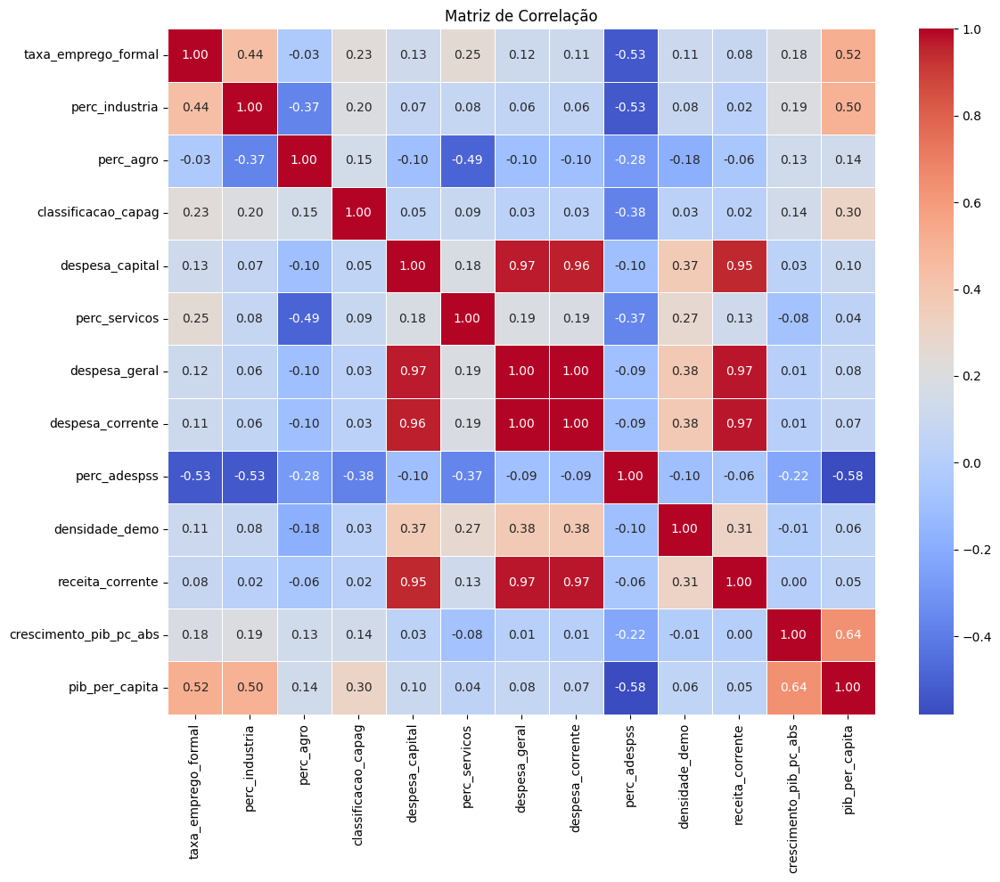

In [ ]:
colunas_selecionadas = [
    'taxa_emprego_formal',
    'perc_industria',
    'perc_agro',
    'classificacao_capag',
    'despesa_capital',
    'perc_servicos',
    'despesa_geral',
    'despesa_corrente',
    'perc_adespss',
    'densidade_demo',
    'receita_corrente',
    'crescimento_pib_pc_abs',
    'pib_per_capita'
]

colunas_selecionadas = list(dict.fromkeys(colunas_selecionadas))

df_filtrado = df[colunas_selecionadas]

corr_filtrada = df_filtrado.corr()

print("Gerando heatmap focado nas suas 12 colunas selecionadas...")

plt.figure(figsize=(12, 10))
sns.heatmap(
    corr_filtrada,
    annot=True,
    cmap='coolwarm',
    fmt='.2f',
    linewidths=.5
)
plt.title('Matriz de Correlação')
plt.tight_layout()

O heatmap mostra bem como as variáveis do banco de dados se relacionam entre si. A primeira coisa que chama atenção é o grupo das variáveis fiscais — despesas de capital, despesa geral, despesa corrente e receita corrente. Todas elas estão muito correlacionadas entre si, com valores próximos de 1, o que indica que estão basicamente medindo a mesma coisa. Isso é um problema para modelos lineares, porque gera multicolinearidade e atrapalha a interpretação dos resultados. Numa análise mais prática, o ideal seria escolher apenas uma dessas variáveis para representar esse conjunto (por exemplo, a receita corrente per capita) ou criar algum indicador que mostre o quanto o município investe em relação ao total gasto.

Outro ponto importante é a relação entre o PIB per capita e as variáveis de estrutura produtiva e de emprego. A taxa de emprego formal e o percentual da indústria têm correlação positiva moderada com o PIB per capita, o que faz bastante sentido: municípios com mais empregos formais e presença industrial tendem a ser mais desenvolvidos economicamente. Já o percentual da agropecuária mostra uma correlação bem fraca, o que também é esperado, já que esse setor costuma ter menor produtividade média. Por outro lado, o percentual de despesas com assistência e previdência social aparece com correlação negativa relativamente alta em relação ao PIB per capita, o que indica que municípios com renda mais baixa gastam proporcionalmente mais com políticas sociais. A classificação CAPAG praticamente não se relaciona com o PIB per capita, mostrando que a capacidade fiscal do município não está diretamente ligada ao seu nível de riqueza. A densidade demográfica também tem pouca correlação, o que pode significar que seu efeito é mais complexo e talvez precise ser transformado (por exemplo, usando logaritmo) para captar melhor a diferença entre cidades pequenas e grandes.

In [ ]:
colunas = [
    'taxa_emprego_formal',
    'perc_industria',
    'perc_agro',
    'classificacao_capag',
    'perc_servicos',
    'perc_adespss',
]

fig = px.box(df[colunas])
fig.show()

In [ ]:
colunas_fin = [
    'despesa_capital',
    'despesa_geral',
    'despesa_corrente',
    'receita_corrente'
]

fig4 = px.box(df[colunas_fin])
fig4.show()

In [ ]:
fig1 = px.box(df['pib_per_capita'])
fig1.show()
fig2 = px.box(df['densidade_demo'])
fig2.show()
fig3 = px.box(df['crescimento_pib_pc_abs'])
fig3.show()

Os boxplots ajudam a enxergar como os dados estão distribuídos e mostram claramente que há muita variação entre os municípios do Brasil. A variável de crescimento absoluto do PIB per capita tem muitos valores extremos, tanto positivos quanto negativos. A maior parte dos municípios está concentrada perto da mediana (em torno de 1), mas existem alguns casos muito altos (acima de 700) e outros muito baixos (abaixo de –200). Isso indica que há outliers fortes e que seria melhor trabalhar com o crescimento em termos percentuais, fazer uma transformação logarítmica ou até aplicar alguma técnica para limitar esses valores extremos (como winsorizar os dados).

As variáveis fiscais — despesas e receitas — também mostram distribuições muito concentradas com alguns valores muito altos, o que reflete as diferenças enormes entre municípios pequenos e grandes capitais. O PIB per capita segue o mesmo padrão: a maioria dos municípios está em faixas baixas, mas há alguns com valores muito acima do restante. Nesse caso, aplicar o logaritmo pode ajudar a equilibrar melhor a distribuição e deixar os modelos mais estáveis. A densidade demográfica também tem uma cauda longa, com poucas cidades muito densas e a maioria bem espalhada. No geral, os boxplots indicam que o banco de dados tem uma grande variação entre os municípios, com muitas diferenças de escala, e por isso vai ser importante normalizar e transformar algumas variáveis antes de rodar qualquer modelo estatístico ou de machine learning.

###REGRESSÃO MULTIPLA

In [ ]:
df['receita_corrente_pc'] = df['receita_corrente'] / df['populacao'].replace(0, np.nan)
df['capex_share'] = df['despesa_capital'] / df['despesa_geral'].replace(0, np.nan)

for col in ['receita_corrente_pc', 'densidade_demo', 'pib_per_capita']:
    df.loc[df[col] <= 0, col] = np.nan

df['log_densidade'] = np.log1p(df['densidade_demo'])
df['log_receita_corrente_pc'] = np.log1p(df['receita_corrente_pc'])
df['log_pib_pc'] = np.log1p(df['pib_per_capita'])

df = df.dropna(subset=['log_pib_pc', 'log_receita_corrente_pc', 'log_densidade'])

In [ ]:
df = df.replace([np.inf, -np.inf], np.nan)
df = df.dropna()
print("Linhas finais no dataset:", len(df))

Linhas finais no dataset: 22239


In [ ]:
features = [
    'taxa_emprego_formal',
    'perc_industria',
    'perc_agro',
    'log_densidade',
    'log_receita_corrente_pc',
    'capex_share',
    'perc_adespss'
]

X_vif = sm.add_constant(df[features])
vif_data = pd.DataFrame()
vif_data["Variável"] = X_vif.columns
vif_data["VIF"] = [variance_inflation_factor(X_vif.values, i)
                   for i in range(X_vif.shape[1])]
print("\n=== TESTE DE MULTICOLINEARIDADE (VIF) ===")
print(vif_data)

X = sm.add_constant(df[features])
y = df['log_pib_pc']

modelo = sm.OLS(y, X).fit()

print("\n=== RESULTADOS DA REGRESSÃO MÚLTIPLA ===")
print(modelo.summary())

print("\nR² ajustado:", round(modelo.rsquared_adj, 3))
print("Observações:", len(df))
print("\nCoeficientes mais relevantes:")
print(modelo.params.sort_values(ascending=False))


=== TESTE DE MULTICOLINEARIDADE (VIF) ===
                  Variável         VIF
0                    const  296.274833
1      taxa_emprego_formal    1.567513
2           perc_industria    2.632811
3                perc_agro    3.137308
4            log_densidade    1.741834
5  log_receita_corrente_pc    2.715215
6              capex_share    1.056001
7             perc_adespss    4.934674

=== RESULTADOS DA REGRESSÃO MÚLTIPLA ===
                            OLS Regression Results                            
Dep. Variable:             log_pib_pc   R-squared:                       0.868
Model:                            OLS   Adj. R-squared:                  0.868
Method:                 Least Squares   F-statistic:                 2.096e+04
Date:                Wed, 12 Nov 2025   Prob (F-statistic):               0.00
Time:                        18:55:44   Log-Likelihood:                -504.89
No. Observations:               22239   AIC:                             1026.
Df Residual

A regressão linear múltipla apresentou resultados muito consistentes e coerentes com o comportamento esperado dos indicadores socioeconômicos. O modelo obteve um R² ajustado de 0,868, o que significa que cerca de 87% da variação do PIB per capita entre os municípios brasileiros é explicada pelas variáveis incluídas. Esse é um valor bastante elevado para dados municipais, indicando que o conjunto de variáveis escolhidas realmente representa os principais fatores que determinam o nível de desenvolvimento econômico local. Além disso, todas as variáveis mostraram p-valores muito baixos, o que confirma que elas são estatisticamente significativas para explicar o PIB per capita.
Os resultados do teste de multicolinearidade (VIF) também mostraram que o modelo está bem ajustado. Nenhuma variável ultrapassou o limite crítico de 5, o que significa que não há dependência forte entre as variáveis independentes. As correlações mais altas aparecem entre os percentuais setoriais e as variáveis fiscais, o que já era esperado, pois essas dimensões da economia municipal tendem a se relacionar naturalmente. Mesmo assim, os valores ficaram dentro do aceitável, o que permite manter todas as variáveis no modelo sem comprometer a estabilidade dos coeficientes. De forma geral, o modelo conseguiu capturar as principais dimensões econômicas, demográficas e fiscais sem redundância excessiva.
Analisando os coeficientes, fica claro que as variáveis ligadas à estrutura produtiva e ao emprego são as que mais influenciam o PIB per capita. A taxa de emprego formal apresentou o maior coeficiente positivo (1,45), indicando que municípios com mais trabalhadores formais tendem a ser significativamente mais ricos. Esse resultado faz todo o sentido, já que o emprego formal está diretamente ligado à produtividade, à arrecadação de impostos e à circulação de renda dentro da economia local. Logo em seguida vem o percentual da indústria (1,24), que reforça a importância da base produtiva como motor do desenvolvimento municipal. A presença de atividades industriais costuma gerar empregos de maior valor agregado e impulsionar outros setores da economia, o que explica sua relação tão forte com o PIB per capita. O percentual da agropecuária também aparece com sinal positivo (0,98), mas com impacto menor, o que mostra que, embora importante, o setor agrícola contribui menos para a geração de renda média quando comparado à indústria.
Entre as variáveis fiscais, a receita corrente per capita e o esforço de investimento (capex share) aparecem com coeficientes positivos, de 0,20 e 0,17, respectivamente. Isso significa que municípios que arrecadam mais recursos por habitante e que investem uma parcela maior do orçamento tendem a ter níveis de renda mais altos. Esse resultado reforça a ideia de que uma boa capacidade fiscal e a destinação de recursos para investimentos em infraestrutura ou desenvolvimento local ajudam a impulsionar a economia municipal. Por outro lado, o percentual de despesas com assistência e previdência social apresentou um coeficiente negativo forte (–1,48), indicando que municípios com maior peso dessas despesas são, em geral, os mais pobres. Esse resultado é coerente com a realidade brasileira, em que as cidades com menor dinamismo econômico acabam dependendo mais de transferências e políticas sociais.
A variável de densidade demográfica, transformada em logaritmo, apresentou um pequeno coeficiente negativo (–0,01). Isso sugere que, no conjunto do país, cidades mais densas não necessariamente têm maior renda per capita — o que pode estar relacionado a desigualdades urbanas e à concentração de pobreza em grandes centros. Esse é um ponto interessante para discussão, pois mostra que a urbanização, sozinha, não garante desenvolvimento econômico.
De forma geral, o modelo se mostrou robusto e coerente com as teorias sobre desenvolvimento regional. Ele mostra que o crescimento econômico municipal está fortemente ligado à estrutura produtiva e à formalização do trabalho, enquanto fatores como maior dependência de gastos sociais e baixa capacidade de investimento público estão associados a menores níveis de renda. Os resultados indicam que políticas voltadas para a diversificação produtiva, a industrialização e o fortalecimento do mercado formal de trabalho tendem a ter os maiores impactos sobre o desenvolvimento dos municípios. Esses achados reforçam a utilidade do modelo para compreender e identificar, de forma quantitativa, os fatores que mais influenciam o potencial econômico local.

---
##ANÁLISE EXPLORATÓRIA (EDA) - NORDESTE
---

In [ ]:
ufs_nordeste = ['PE', 'PB', 'RN', 'CE', 'PI', 'MA', 'AL', 'SE', 'BA']
df_ne = df[df['uf'].isin(ufs_nordeste)].copy()
print("Número de municípios do Nordeste:", len(df_ne))

Número de municípios do Nordeste: 7172


In [ ]:
df_ne.head()

,id_municipio,municipio,ano,uf,populacao,area,classificacao_capag,pib,impostos_liquidos,va,...,perc_agro,perc_industria,perc_servicos,perc_adespss,perc_impostos,receita_corrente_pc,capex_share,log_densidade,log_receita_corrente_pc,log_pib_pc
88,2705606,Novo Lino,2021,AL,12837,219.327,2,187226,2804,184422,...,0.469161,0.021830,0.146251,0.362753,0.014976,301.792325,0.023432,4.086464,5.713047,2.746228
89,2700300,Arapiraca,2021,AL,234309,346.188,2,5915938,661844,5254094,...,0.220678,0.088818,0.509199,0.181305,0.111875,1725.776431,0.064468,6.518890,7.454012,3.267603
90,2706000,Olivença,2021,AL,11681,174.188,2,108843,3968,104875,...,0.140986,0.028453,0.230224,0.600328,0.036456,325.265506,0.045227,4.220386,5.787711,2.333808
91,2700201,Anadia,2021,AL,17507,186.074,2,250457,8543,241915,...,0.359679,0.058173,0.197606,0.384534,0.034110,276.974141,0.163429,4.554784,5.627528,2.728198
92,2701001,Boca da Mata,2021,AL,27429,192.952,2,506028,21145,484883,...,0.449505,0.086493,0.194438,0.269561,0.041786,518.890233,0.084366,4.963925,6.253618,2.967743


In [ ]:
df_ne.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7172 entries, 88 to 21711
Data columns (total 37 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id_municipio             7172 non-null   object 
 1   municipio                7172 non-null   object 
 2   ano                      7172 non-null   int64  
 3   uf                       7172 non-null   object 
 4   populacao                7172 non-null   int64  
 5   area                     7172 non-null   float64
 6   classificacao_capag      7172 non-null   int64  
 7   pib                      7172 non-null   int64  
 8   impostos_liquidos        7172 non-null   int64  
 9   va                       7172 non-null   int64  
 10  va_agropecuaria          7172 non-null   int64  
 11  va_industria             7172 non-null   int64  
 12  va_servicos              7172 non-null   int64  
 13  va_adespss               7172 non-null   int64  
 14  total_vinculos           71

In [ ]:
df_ne.describe()

,ano,populacao,area,classificacao_capag,pib,impostos_liquidos,va,va_agropecuaria,va_industria,va_servicos,...,perc_agro,perc_industria,perc_servicos,perc_adespss,perc_impostos,receita_corrente_pc,capex_share,log_densidade,log_receita_corrente_pc,log_pib_pc
count,7172.000000,7.172000e+03,7172.000000,7172.000000,7.172000e+03,7.172000e+03,7.172000e+03,7.172000e+03,7.172000e+03,7.172000e+03,...,7172.000000,7172.000000,7172.000000,7172.000000,7172.000000,7172.000000,7172.000000,7172.000000,7172.000000,7172.000000
mean,2019.500000,3.191051e+04,865.675854,2.199247,6.099175e+05,7.619403e+04,5.337235e+05,4.260666e+04,1.035568e+05,2.528010e+05,...,0.143965,0.096247,0.295445,0.464332,0.059057,729.375245,0.086405,3.556534,6.230950,2.523844
std,1.118112,1.194139e+05,1354.948447,0.520166,3.115783e+06,5.072687e+05,2.621744e+06,1.400189e+05,5.598960e+05,1.722435e+06,...,0.124467,0.121274,0.110167,0.150403,0.035917,1028.836900,0.052975,1.154846,0.777248,0.462243
min,2018.000000,1.239000e+03,19.793000,1.000000,1.412700e+04,3.470000e+02,1.377200e+04,3.230000e+02,3.510000e+02,2.149000e+03,...,0.000200,0.013652,0.024548,0.020802,0.002646,0.000509,0.000000,0.599543,0.000509,1.700178
25%,2018.750000,7.639750e+03,211.143000,2.000000,7.366200e+04,2.901000e+03,7.040675e+04,6.731750e+03,3.000500e+03,1.671550e+04,...,0.062270,0.037992,0.220204,0.365257,0.036882,326.285668,0.051338,2.826709,5.790833,2.241532
50%,2019.500000,1.456900e+04,442.292000,2.000000,1.450800e+05,6.885000e+03,1.376765e+05,1.521700e+04,7.097000e+03,3.696650e+04,...,0.109130,0.050698,0.268776,0.484450,0.048954,472.472346,0.075202,3.469340,6.160094,2.414166
75%,2020.250000,2.623250e+04,972.551000,2.000000,3.153070e+05,1.940925e+04,2.931450e+05,3.621350e+04,2.471250e+04,8.968675e+04,...,0.184508,0.090375,0.346047,0.580326,0.069351,727.825144,0.108723,4.226238,6.591434,2.662843
max,2021.000000,2.900319e+06,15634.328000,4.000000,7.343613e+07,1.281131e+07,6.062482e+07,4.191028e+06,1.571532e+07,4.183924e+07,...,0.880030,0.932851,0.863918,0.784439,0.446195,17286.469286,1.000000,9.162673,9.757737,5.777042


###HEATMAP DE CORRELAÇÃO E BOXPLOT

Gerando heatmap focado nas suas 12 colunas selecionadas...


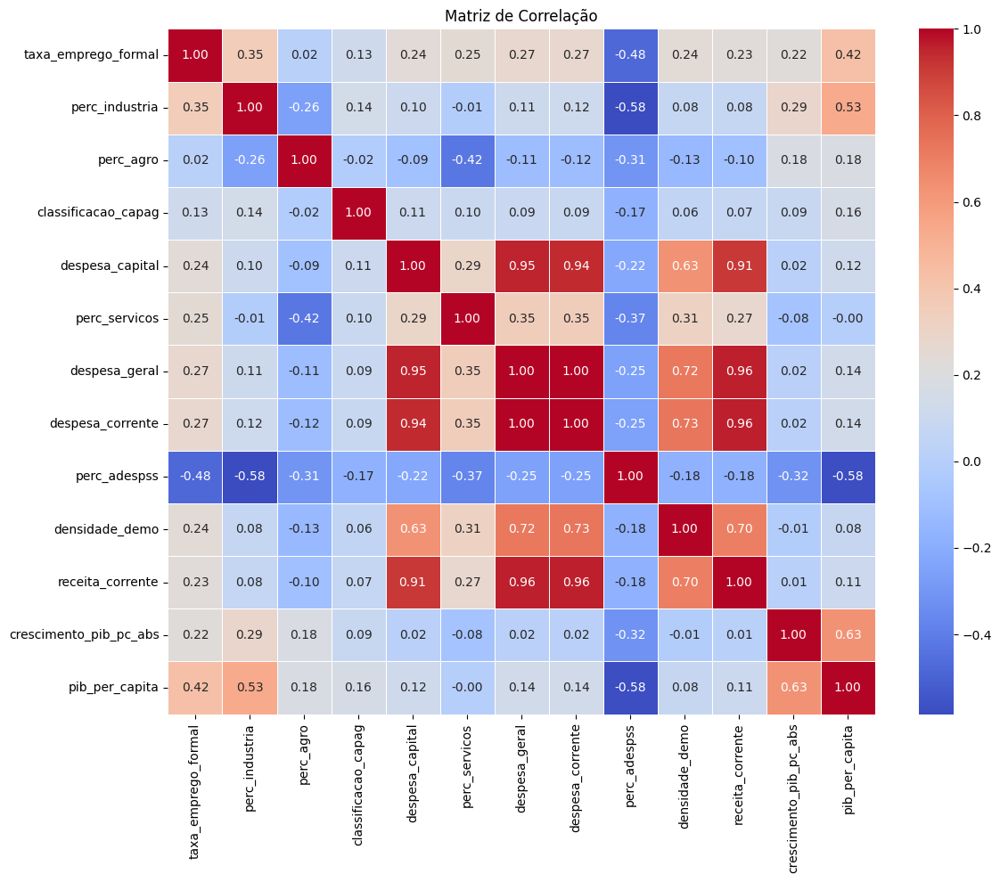

In [ ]:
colunas_selecionadas = [
    'taxa_emprego_formal',
    'perc_industria',
    'perc_agro',
    'classificacao_capag',
    'despesa_capital',
    'perc_servicos',
    'despesa_geral',
    'despesa_corrente',
    'perc_adespss',
    'densidade_demo',
    'receita_corrente',
    'crescimento_pib_pc_abs',
    'pib_per_capita'
]

colunas_selecionadas = list(dict.fromkeys(colunas_selecionadas))

df_ne_filtrado = df_ne[colunas_selecionadas]

corr_filtrada = df_ne_filtrado.corr()

print("Gerando heatmap focado nas suas 12 colunas selecionadas...")

plt.figure(figsize=(12, 10))
sns.heatmap(
    corr_filtrada,
    annot=True,
    cmap='coolwarm',
    fmt='.2f',
    linewidths=.5
)
plt.title('Matriz de Correlação')
plt.tight_layout()

In [ ]:
colunas = [
    'taxa_emprego_formal',
    'perc_industria',
    'perc_agro',
    'classificacao_capag',
    'perc_servicos',
    'perc_adespss',
]

fig = px.box(df_ne[colunas])
fig.show()

In [ ]:
colunas_fin = [
    'despesa_capital',
    'despesa_geral',
    'despesa_corrente',
    'receita_corrente'
]

fig4 = px.box(df_ne[colunas_fin])
fig4.show()

In [ ]:
fig1 = px.box(df_ne['pib_per_capita'])
fig1.show()
fig2 = px.box(df_ne['densidade_demo'])
fig2.show()
fig3 = px.box(df_ne['crescimento_pib_pc_abs'])
fig3.show()

###REGRESSÃO MULTIPLA

In [ ]:
df_ne['receita_corrente_pc'] = df_ne['receita_corrente'] / df_ne['populacao'].replace(0, np.nan)
df_ne['capex_share'] = df_ne['despesa_capital'] / df_ne['despesa_geral'].replace(0, np.nan)

for col in ['receita_corrente_pc', 'densidade_demo', 'pib_per_capita']:
    df_ne.loc[df_ne[col] <= 0, col] = np.nan

df_ne['log_densidade'] = np.log1p(df_ne['densidade_demo'])
df_ne['log_receita_corrente_pc'] = np.log1p(df_ne['receita_corrente_pc'])
df_ne['log_pib_pc'] = np.log1p(df_ne['pib_per_capita'])

df_ne = df_ne.replace([np.inf, -np.inf], np.nan).dropna()

X_ne = sm.add_constant(df_ne[features])
y_ne = df_ne['log_pib_pc']

vif_ne = pd.DataFrame()
vif_ne["Variável"] = X_ne.columns
vif_ne["VIF"] = [variance_inflation_factor(X_ne.values, i)
                 for i in range(X_ne.shape[1])]
print("\n=== VIF - Nordeste ===")
print(vif_ne)

modelo_ne = sm.OLS(y_ne, X_ne).fit()
print("\n=== RESULTADOS - REGRESSÃO NORDESTE ===")
print(modelo_ne.summary())

print("\nR² ajustado:", round(modelo_ne.rsquared_adj, 3))
print("Observações:", len(df_ne))
print("\nCoeficientes ordenados:")
print(modelo_ne.params.sort_values(ascending=False))


=== VIF - Nordeste ===
                  Variável         VIF
0                    const  259.827476
1      taxa_emprego_formal    1.406641
2           perc_industria    2.358134
3                perc_agro    2.093744
4            log_densidade    1.305116
5  log_receita_corrente_pc    1.694875
6              capex_share    1.028107
7             perc_adespss    3.502063

=== RESULTADOS - REGRESSÃO NORDESTE ===
                            OLS Regression Results                            
Dep. Variable:             log_pib_pc   R-squared:                       0.789
Model:                            OLS   Adj. R-squared:                  0.789
Method:                 Least Squares   F-statistic:                     3837.
Date:                Wed, 12 Nov 2025   Prob (F-statistic):               0.00
Time:                        18:55:46   Log-Likelihood:                 945.16
No. Observations:                7172   AIC:                            -1874.
Df Residuals:                  

Comparação entre os modelos (Brasil x Nordeste)
1. Ajuste do modelo
O modelo do Nordeste continua bem explicado, com R² ajustado de 0,789, um pouco menor que o 0,868 do modelo nacional. Essa diferença já era esperada, porque o Nordeste é mais heterogêneo e tem economias locais menos diversificadas. Mesmo assim, o valor é alto e mostra que as variáveis seguem explicando bem o PIB per capita da região.
2. Estrutura produtiva
As variáveis de emprego formal e indústria continuam sendo as mais importantes e ganharam até mais peso no Nordeste. Isso mostra que os municípios que conseguem gerar empregos formais e manter alguma base industrial se destacam ainda mais em termos de renda. O setor agropecuário manteve impacto positivo, mas menor.
3. Finanças públicas
A receita corrente per capita segue com efeito positivo, mas mais fraco do que no Brasil inteiro. O capex_share, que era positivo no modelo nacional, ficou negativo no Nordeste, indicando que o aumento dos gastos de capital nem sempre se traduz em ganhos econômicos imediatos.
4. Despesas sociais e demografia
As despesas sociais continuam com forte impacto negativo, reforçando que os municípios mais dependentes dessas políticas são os mais pobres. A densidade demográfica, que era negativa no modelo nacional, passou a ser levemente positiva, sugerindo que cidades mais densas no Nordeste, como capitais e polos regionais têm um pequeno ganho de renda per capita.
5. Conclusão geral
O modelo do Nordeste mantém o mesmo padrão do nacional, mas com diferenças que refletem a realidade regional: maior peso da formalização e da indústria, efeito menor das finanças locais e maior dependência das políticas públicas.

In [ ]:
features_sem_adespss = [
    'taxa_emprego_formal',
    'perc_industria',
    'perc_agro',
    'log_densidade',
    'log_receita_corrente_pc',
    'capex_share',
]

In [ ]:
df_ne['receita_corrente_pc'] = df_ne['receita_corrente'] / df_ne['populacao'].replace(0, np.nan)
df_ne['capex_share'] = df_ne['despesa_capital'] / df_ne['despesa_geral'].replace(0, np.nan)

for col in ['receita_corrente_pc', 'densidade_demo', 'pib_per_capita']:
    df_ne.loc[df_ne[col] <= 0, col] = np.nan

df_ne['log_densidade'] = np.log1p(df_ne['densidade_demo'])
df_ne['log_receita_corrente_pc'] = np.log1p(df_ne['receita_corrente_pc'])
df_ne['log_pib_pc'] = np.log1p(df_ne['pib_per_capita'])

df_ne = df_ne.replace([np.inf, -np.inf], np.nan).dropna()

X_ne = sm.add_constant(df_ne[features_sem_adespss])
y_ne = df_ne['log_pib_pc']

vif_ne = pd.DataFrame()
vif_ne["Variável"] = X_ne.columns
vif_ne["VIF"] = [variance_inflation_factor(X_ne.values, i)
                 for i in range(X_ne.shape[1])]
print("\n=== VIF - Nordeste ===")
print(vif_ne)

modelo_ne = sm.OLS(y_ne, X_ne).fit()
print("\n=== RESULTADOS - REGRESSÃO NORDESTE ===")
print(modelo_ne.summary())

print("\nR² ajustado:", round(modelo_ne.rsquared_adj, 3))
print("Observações:", len(df_ne))
print("\nCoeficientes ordenados:")
print(modelo_ne.params.sort_values(ascending=False))


=== VIF - Nordeste ===
                  Variável        VIF
0                    const  87.603434
1      taxa_emprego_formal   1.347788
2           perc_industria   1.424048
3                perc_agro   1.175644
4            log_densidade   1.178400
5  log_receita_corrente_pc   1.440997
6              capex_share   1.028072

=== RESULTADOS - REGRESSÃO NORDESTE ===
                            OLS Regression Results                            
Dep. Variable:             log_pib_pc   R-squared:                       0.761
Model:                            OLS   Adj. R-squared:                  0.761
Method:                 Least Squares   F-statistic:                     3809.
Date:                Wed, 12 Nov 2025   Prob (F-statistic):               0.00
Time:                        18:55:46   Log-Likelihood:                 495.92
No. Observations:                7172   AIC:                            -977.8
Df Residuals:                    7165   BIC:                            -929.7

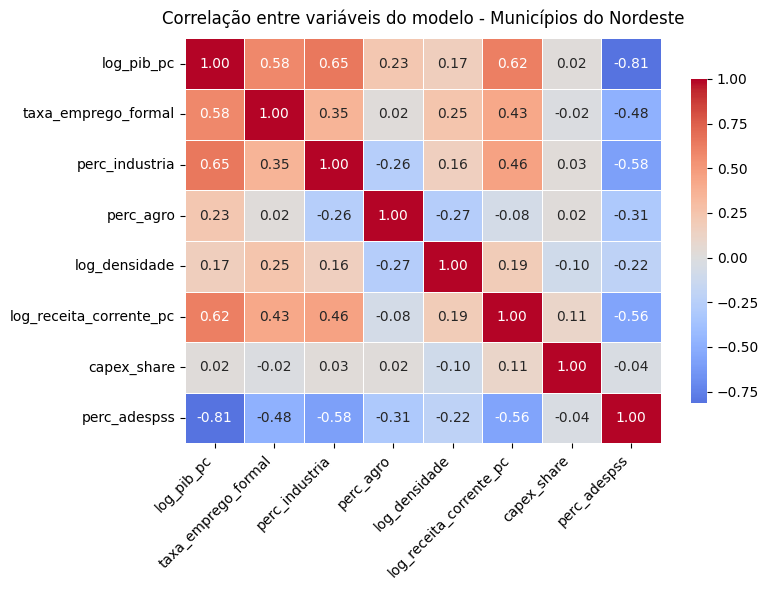

In [ ]:
vars_corr = [
    'log_pib_pc',
    'taxa_emprego_formal',
    'perc_industria',
    'perc_agro',
    'log_densidade',
    'log_receita_corrente_pc',
    'capex_share',
    'perc_adespss'
]

corr_ne = df_ne[vars_corr].corr()

plt.figure(figsize=(8,6))
sns.heatmap(corr_ne, annot=True, cmap='coolwarm', center=0, fmt=".2f",
            linewidths=0.5, cbar_kws={"shrink": .8})
plt.title("Correlação entre variáveis do modelo - Municípios do Nordeste", fontsize=12, pad=10)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

Após a retirada da variável perc_adespss, o modelo de regressão múltipla manteve um bom nível de explicação, com R² ajustado de 0,761 e 7.172 observações. Embora o valor tenha caído um pouco em relação ao modelo anterior (que tinha R² de 0,789), o ganho em robustez e clareza foi significativo. A retirada da variável reduziu a multicolinearidade e permitiu uma leitura mais fiel dos efeitos das demais variáveis sobre o PIB per capita.

---
##MACHINE LEARNING
---

###RANDOM FOREST

=== RANDOM FOREST ===
R²: 0.908
RMSE: 0.139


/tmp/ipython-input-3824262881.py:28: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




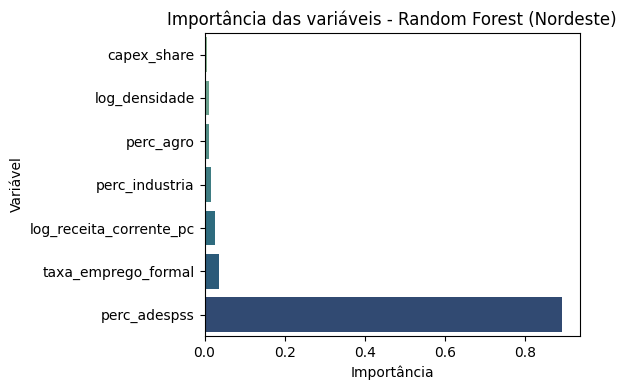

In [ ]:
X = df_ne[features]
y = df_ne['log_pib_pc']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

rf = RandomForestRegressor(
    n_estimators=300,
    max_depth=10,
    random_state=42,
    n_jobs=-1
)
rf.fit(X_train, y_train)

y_pred_rf = rf.predict(X_test)

r2_rf = r2_score(y_test, y_pred_rf)
rmse_rf = np.sqrt(mean_squared_error(y_test, y_pred_rf))

print("=== RANDOM FOREST ===")
print(f"R²: {r2_rf:.3f}")
print(f"RMSE: {rmse_rf:.3f}")

importances_rf = pd.Series(rf.feature_importances_, index=features).sort_values(ascending=True)

plt.figure(figsize=(6,4))
sns.barplot(x=importances_rf, y=importances_rf.index, palette="crest")
plt.title("Importância das variáveis - Random Forest (Nordeste)")
plt.xlabel("Importância")
plt.ylabel("Variável")
plt.tight_layout()
plt.show()


O modelo de Random Forest apresentou um peso muito concentrado na variável de despesas sociais, o que indica que parte do ajuste pode estar capturando um padrão estrutural dos dados municípios com alta dependência de políticas sociais são, em geral, os mais pobres. Embora o modelo tenha obtido bom desempenho preditivo, esse comportamento sugere certa sensibilidade a variáveis fortemente correlacionadas com a renda, exigindo comparação com outros algoritmos mais robustos, como o XGBoost.

In [ ]:
df_ne[['perc_adespss', 'log_pib_pc']].corr()

,perc_adespss,log_pib_pc
perc_adespss,1.000000,-0.813758
log_pib_pc,-0.813758,1.000000


=== RANDOM FOREST ===
R²: 0.862
RMSE: 0.171
MAE: 0.127
MAPE: 4.99%


/tmp/ipython-input-349477654.py:33: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




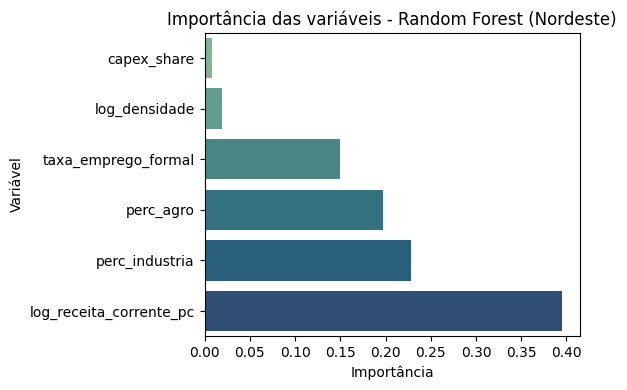

In [ ]:
X = df_ne[features_sem_adespss]
y = df_ne['log_pib_pc']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

rf = RandomForestRegressor(
    n_estimators=300,
    max_depth=10,
    random_state=42,
    n_jobs=-1
)
rf.fit(X_train, y_train)

y_pred_rf = rf.predict(X_test)

r2_rf = r2_score(y_test, y_pred_rf)
rmse_rf = np.sqrt(mean_squared_error(y_test, y_pred_rf))
mae_rf = mean_absolute_error(y_test, y_pred_rf)
mape_rf = np.mean(np.abs((y_test - y_pred_rf) / y_test)) * 100

print("=== RANDOM FOREST ===")
print(f"R²: {r2_rf:.3f}")
print(f"RMSE: {rmse_rf:.3f}")
print(f"MAE: {mae_rf:.3f}")
print(f"MAPE: {mape_rf:.2f}%")


importances_rf = pd.Series(rf.feature_importances_, index=features_sem_adespss).sort_values(ascending=True)

plt.figure(figsize=(6,4))
sns.barplot(x=importances_rf, y=importances_rf.index, palette="crest")
plt.title("Importância das variáveis - Random Forest (Nordeste)")
plt.xlabel("Importância")
plt.ylabel("Variável")
plt.tight_layout()
plt.show()

Após remover a variável perc_adespss, o modelo de Random Forest manteve alto desempenho (R² = 0,862 e RMSE = 0,171), com uma distribuição de importância das variáveis mais equilibrada e interpretável. O destaque passou a ser a receita corrente per capita, que se mostrou o principal preditor do PIB per capita, seguida pelas variáveis de estrutura produtiva (indústria, agropecuária e emprego formal). Essa nova configuração confirma que o modelo anterior estava enviesado pela forte correlação entre as despesas sociais e o nível de renda, e que, ao ajustar isso, o Random Forest passou a representar de forma mais fiel os determinantes econômicos do desenvolvimento municipal no Nordeste.

###GRADIENT BOOSTING - XGBOOST




=== XGBOOST ===
R²: 0.882
RMSE: 0.158
MAE: 0.118
MAPE: 4.61%


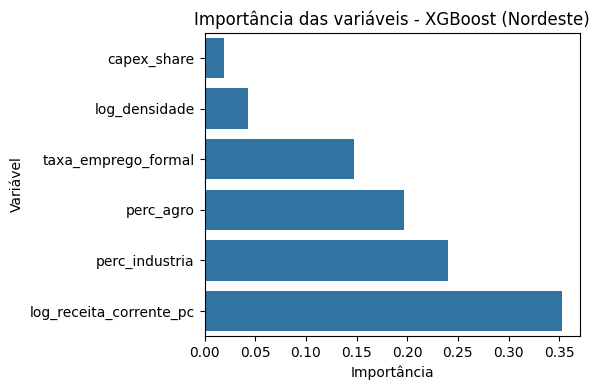

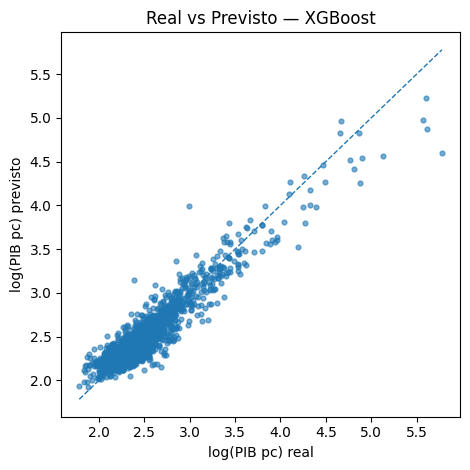

In [ ]:
X = df_ne[features_sem_adespss]
y = df_ne['log_pib_pc']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

xgb = XGBRegressor(
    n_estimators=800,
    learning_rate=0.03,
    max_depth=6,
    subsample=0.9,
    colsample_bytree=0.9,
    reg_lambda=1.0,
    reg_alpha=0.0,
    random_state=42,
    tree_method="hist",
    objective="reg:squarederror"
)

xgb.fit(X_train, y_train)

def mape(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
y_pred = xgb.predict(X_test)
r2 = r2_score(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
mae = mean_absolute_error(y_test, y_pred)
mape_val = mape(y_test, y_pred)

print("=== XGBOOST ===")
print(f"R²: {r2:.3f}")
print(f"RMSE: {rmse:.3f}")
print(f"MAE: {mae:.3f}")
print(f"MAPE: {mape_val:.2f}%")

importances = pd.Series(xgb.feature_importances_, index=features_sem_adespss).sort_values(ascending=True)
plt.figure(figsize=(6,4))
sns.barplot(x=importances, y=importances.index)
plt.title("Importância das variáveis - XGBoost (Nordeste)")
plt.xlabel("Importância")
plt.ylabel("Variável")
plt.tight_layout()
plt.show()

plt.figure(figsize=(4.8,4.8))
plt.scatter(y_test, y_pred, s=12, alpha=0.6)
lims = [min(y_test.min(), y_pred.min()), max(y_test.max(), y_pred.max())]
plt.plot(lims, lims, '--', linewidth=1)
plt.xlabel("log(PIB pc) real")
plt.ylabel("log(PIB pc) previsto")
plt.title("Real vs Previsto — XGBoost")
plt.tight_layout()
plt.show()


O modelo XGBoost apresentou ótimo desempenho na previsão do log do PIB per capita dos municípios do Nordeste, com R² = 0,882 e RMSE = 0,158. Esses valores mostram que o modelo conseguiu explicar bem as variações da renda municipal, ficando levemente abaixo do Random Forest (R² = 0,862), mas ainda com excelente ajuste. O gráfico “real vs previsto” mostra uma boa concentração dos pontos próximos à linha de 45°, indicando que as previsões foram bastante consistentes.

A distribuição de importância das variáveis foi bem equilibrada e coerente com a teoria econômica. A receita corrente per capita se manteve como o principal fator explicativo, reforçando o papel da capacidade fiscal dos municípios no nível de renda local. Em seguida, aparecem o percentual da indústria, o percentual da agropecuária e a taxa de emprego formal, todos com pesos relevantes e positivos, o que mostra que a base produtiva e a formalização do trabalho continuam determinantes para o desenvolvimento regional. Já as variáveis densidade demográfica e capex_share tiveram menor influência, o que é esperado, pois seus efeitos são mais indiretos sobre o PIB per capita.

No geral, o XGBoost confirmou os resultados do Random Forest, mas com uma importância um pouco mais distribuída entre as variáveis, o que sugere um modelo menos enviesado e mais interpretável. Esse comportamento reforça que o desempenho econômico dos municípios nordestinos está fortemente associado à arrecadação local e à presença de setores produtivos mais consolidados.

###COMPARAÇÃO

In [ ]:
r2_lr = modelo_ne.rsquared_adj
rmse_lr = np.sqrt(modelo_ne.mse_resid)
mae_lr = np.mean(np.abs(modelo_ne.resid))
mape_lr = np.mean(np.abs(modelo_ne.resid / y_ne)) * 100

dados_comparacao = {
    'Model': ['Linear Regression (Nordeste)', 'Random Forest (Nordeste)', 'XGBoost (Nordeste)'],
    'R²': [r2_lr, r2_rf, r2],
    'RMSE': [rmse_lr, rmse_rf, rmse],
    'MAE': [mae_lr, mae_rf, mae],
    'MAPE (%)': [mape_lr, mape_rf, mape_val]
}

df_comparacao = pd.DataFrame(dados_comparacao)

print("=== Comparação de Modelos (Nordeste) ===")
display(df_comparacao)

=== Comparação de Modelos (Nordeste) ===


,Model,R²,RMSE,MAE,MAPE (%)
0,Linear Regression (Nordeste),0.761137,0.225915,0.157966,6.103624
1,Random Forest (Nordeste),0.862062,0.171063,0.127406,4.987552
2,XGBoost (Nordeste),0.882309,0.158010,0.117689,4.610549


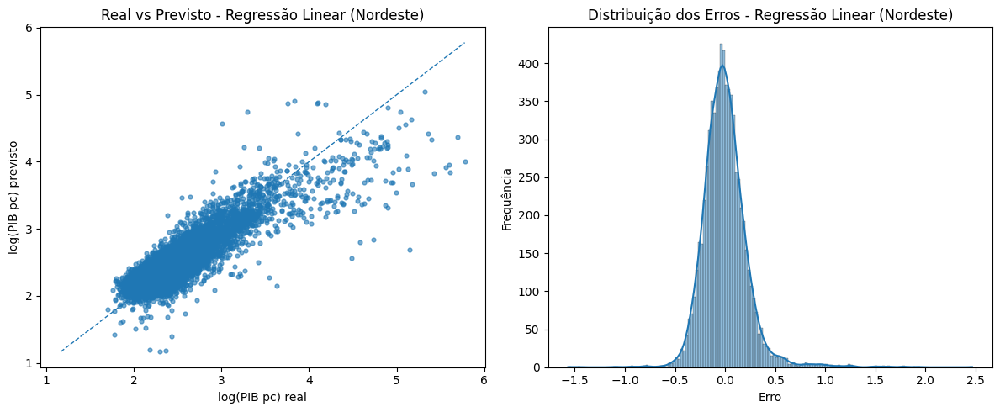

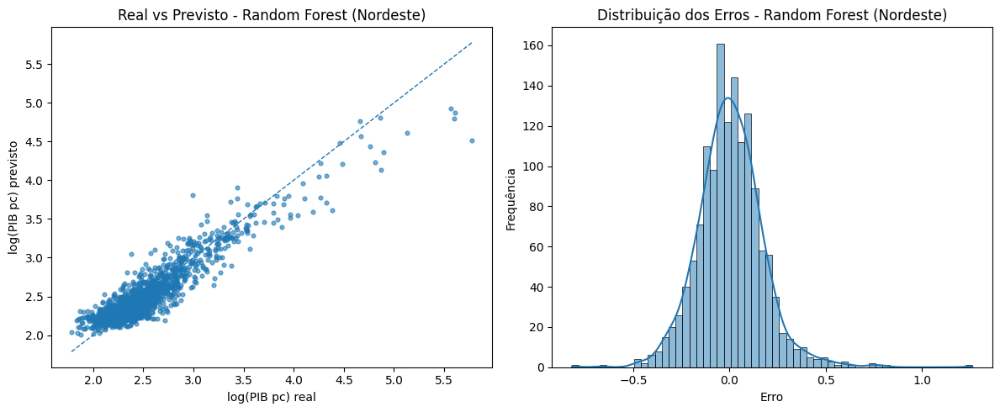

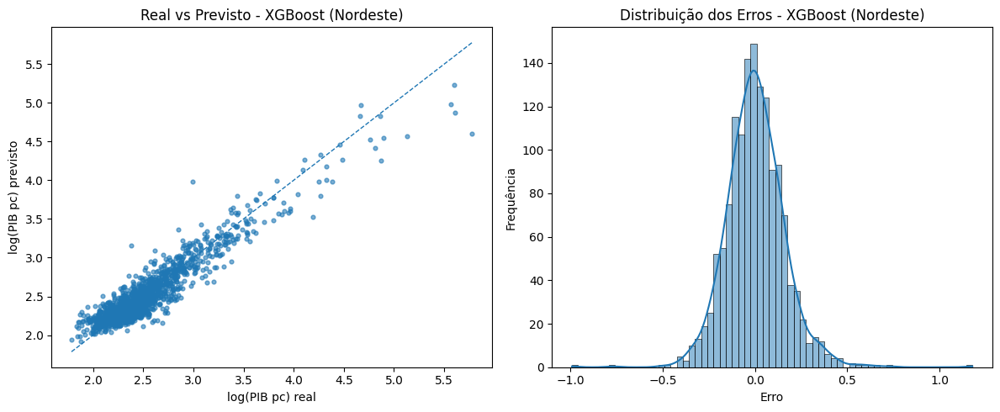

In [ ]:
y_pred_lr = modelo_ne.predict(X_ne)
errors_lr = y_ne - y_pred_lr

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.scatter(y_ne, y_pred_lr, s=12, alpha=0.6)
lims = [min(y_ne.min(), y_pred_lr.min()), max(y_ne.max(), y_pred_lr.max())]
plt.plot(lims, lims, '--', linewidth=1)
plt.xlabel("log(PIB pc) real")
plt.ylabel("log(PIB pc) previsto")
plt.title("Real vs Previsto - Regressão Linear (Nordeste)")

plt.subplot(1, 2, 2)
sns.histplot(errors_lr, kde=True)
plt.title("Distribuição dos Erros - Regressão Linear (Nordeste)")
plt.xlabel("Erro")
plt.ylabel("Frequência")

plt.tight_layout()
plt.show()

errors_rf = y_test - y_pred_rf

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.scatter(y_test, y_pred_rf, s=12, alpha=0.6)
lims = [min(y_test.min(), y_pred_rf.min()), max(y_test.max(), y_pred_rf.max())]
plt.plot(lims, lims, '--', linewidth=1)
plt.xlabel("log(PIB pc) real")
plt.ylabel("log(PIB pc) previsto")
plt.title("Real vs Previsto - Random Forest (Nordeste)")

plt.subplot(1, 2, 2)
sns.histplot(errors_rf, kde=True)
plt.title("Distribuição dos Erros - Random Forest (Nordeste)")
plt.xlabel("Erro")
plt.ylabel("Frequência")

plt.tight_layout()
plt.show()

errors_xgb = y_test - y_pred

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.scatter(y_test, y_pred, s=12, alpha=0.6)
lims = [min(y_test.min(), y_pred.min()), max(y_test.max(), y_pred.max())]
plt.plot(lims, lims, '--', linewidth=1)
plt.xlabel("log(PIB pc) real")
plt.ylabel("log(PIB pc) previsto")
plt.title("Real vs Previsto - XGBoost (Nordeste)")

plt.subplot(1, 2, 2)
sns.histplot(errors_xgb, kde=True)
plt.title("Distribuição dos Erros - XGBoost (Nordeste)")
plt.xlabel("Erro")
plt.ylabel("Frequência")

plt.tight_layout()
plt.show()

A regressão linear apresentou desempenho sólido, mas limitada para capturar relações não lineares. O Random Forest melhorou consideravelmente as previsões e reduziu os erros médios. O XGBoost apresentou o melhor ajuste geral, com R² de 0,88 e MAPE de apenas 4,6%, indicando alta precisão e estabilidade. Esses resultados mostram que os modelos de aprendizado de máquina, especialmente o XGBoost, conseguem representar de forma mais completa as interações entre indicadores socioeconômicos e o PIB per capita municipal, reforçando seu uso como ferramenta para identificar municípios com maior potencial de investimento.

In [ ]:
y_pred_full = xgb.predict(df_ne[features_sem_adespss])

df_ranking = df_ne.copy()
df_ranking["log_pib_pc_previsto"] = y_pred_full

df_ranking["pib_pc_previsto"] = np.expm1(df_ranking["log_pib_pc_previsto"])

df_ranking_sorted = df_ranking.sort_values(by="pib_pc_previsto", ascending=False)

top50 = df_ranking_sorted.head(50)
display(top50[["municipio", "uf", "pib_per_capita", "pib_pc_previsto", "taxa_emprego_formal",
                "perc_industria", "perc_agro", "log_receita_corrente_pc", "ano"]])

,municipio,uf,pib_per_capita,pib_pc_previsto,taxa_emprego_formal,perc_industria,perc_agro,log_receita_corrente_pc,ano
1616,São Francisco do Conde,BA,295.499578,278.314941,0.219804,0.691690,0.001558,8.938353,2020
4718,Godofredo Viana,MA,219.637670,207.097458,0.132683,0.830908,0.003956,8.620553,2021
2121,São Francisco do Conde,BA,225.328122,203.309082,0.093675,0.566082,0.001681,8.981856,2018
4597,Santo Antônio dos Lopes,MA,210.483640,202.387024,0.090521,0.932851,0.005733,8.586532,2021
14732,São Bento do Norte,RN,204.331473,193.071777,0.321920,0.887423,0.020709,9.613488,2021
2039,São Francisco do Conde,BA,269.185514,185.436508,0.105045,0.617162,0.001389,8.923432,2019
4785,Santo Antônio dos Lopes,MA,163.084142,170.651428,0.087454,0.924203,0.006410,9.510330,2020
1149,Formosa do Rio Preto,BA,176.485026,165.812805,0.101834,0.032807,0.765274,8.034662,2021
2655,São Gonçalo do Amarante,CE,175.099621,160.109558,0.284529,0.743105,0.006729,9.236434,2021
863,Jaborandi,BA,164.387550,156.810089,0.228718,0.059158,0.778284,8.558623,2021


In [ ]:
df_2021 = df_ranking[df_ranking['ano'] == 2021].copy()

ranking_2021 = df_2021.sort_values(by='pib_pc_previsto', ascending=False)

ranking_2021 = ranking_2021[['municipio', 'uf', 'pib_per_capita', 'pib_pc_previsto',
                              'taxa_emprego_formal', 'perc_industria', 'perc_agro',
                              'log_receita_corrente_pc']]

top50_2021 = ranking_2021.head(50)
display(top50_2021)

,municipio,uf,pib_per_capita,pib_pc_previsto,taxa_emprego_formal,perc_industria,perc_agro,log_receita_corrente_pc
4718,Godofredo Viana,MA,219.637670,207.097458,0.132683,0.830908,0.003956,8.620553
4597,Santo Antônio dos Lopes,MA,210.483640,202.387024,0.090521,0.932851,0.005733,8.586532
14732,São Bento do Norte,RN,204.331473,193.071777,0.321920,0.887423,0.020709,9.613488
1149,Formosa do Rio Preto,BA,176.485026,165.812805,0.101834,0.032807,0.765274,8.034662
2655,São Gonçalo do Amarante,CE,175.099621,160.109558,0.284529,0.743105,0.006729,9.236434
863,Jaborandi,BA,164.387550,156.810089,0.228718,0.059158,0.778284,8.558623
13506,Baixa Grande do Ribeiro,PI,150.491746,149.475128,0.231895,0.046596,0.756417,7.751331
12880,Ipojuca,PE,150.646263,147.988281,0.295153,0.605908,0.016258,9.517309
14766,Bodó,RN,131.940608,130.076935,0.146476,0.867133,0.014378,7.939150
4551,Tasso Fragoso,MA,272.064330,129.647125,0.197871,0.029602,0.811131,7.472711


###VISUALIZAÇÕES

Gerando previsões para todos os municípios do NE...
Filtrando dados de 2021 para o mapa...
Top 10 IDs identificados.
Baixando os mapas dos municípios (aguarde)...
Baixando o mapa da Região Nordeste...
Gerando o mapa...


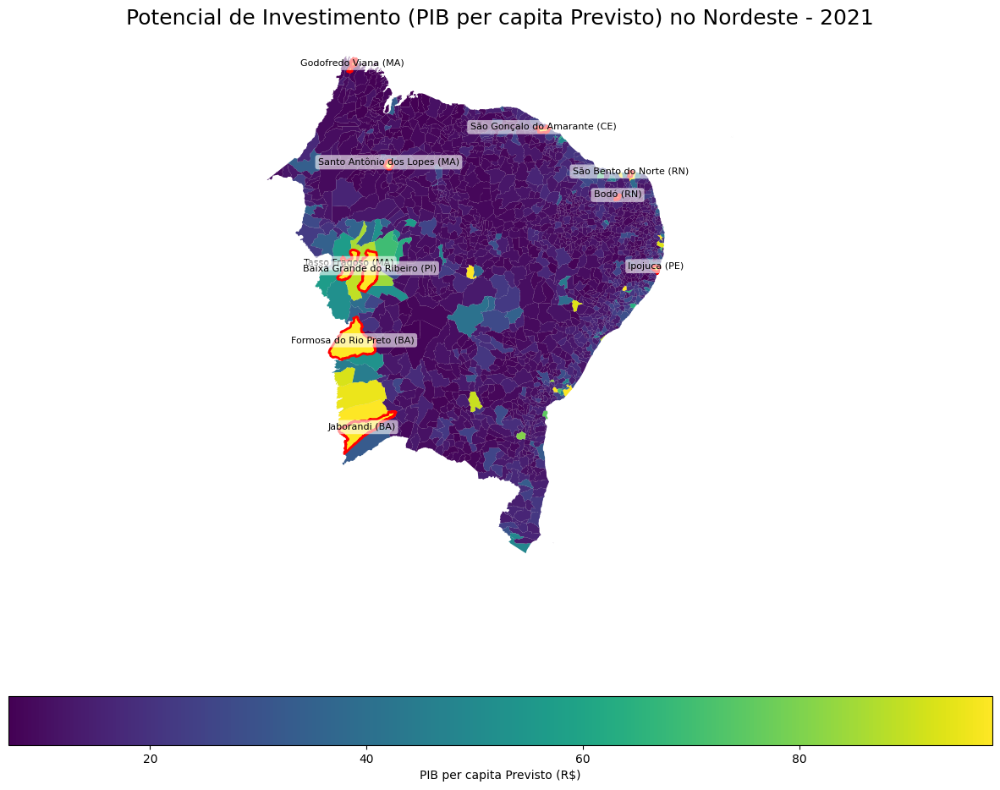

In [ ]:

print("Gerando previsões para todos os municípios do NE...")
y_pred_full = xgb.predict(df_ne[features_sem_adespss])

df_ranking = df_ne.copy()
df_ranking["log_pib_pc_previsto"] = y_pred_full
df_ranking["pib_pc_previsto"] = np.expm1(df_ranking["log_pib_pc_previsto"])

print("Filtrando dados de 2021 para o mapa...")
df_mapa_2021 = df_ranking[df_ranking['ano'] == 2021].copy()

df_mapa_2021['id_municipio_int'] = df_mapa_2021['id_municipio'].astype(int)

top_10_ids = df_mapa_2021.nlargest(10, 'pib_pc_previsto')['id_municipio_int'].tolist()
print(f"Top 10 IDs identificados.")

print("Baixando os mapas dos municípios (aguarde)...")
geo_municipios_todos = geobr.read_municipality(code_muni='all', year=2020)

print("Baixando o mapa da Região Nordeste...")
geo_regioes_todas = geobr.read_region(year=2020)
geo_regiao_ne = geo_regioes_todas[geo_regioes_todas['code_region'] == 2].copy()

geo_municipios_todos['code_muni_int'] = geo_municipios_todos['code_muni'].astype(int)

mapa_data_completo = geo_municipios_todos.merge(
    df_mapa_2021,
    left_on='code_muni_int',
    right_on='id_municipio_int'
)

print("Gerando o mapa...")
fig, ax = plt.subplots(figsize=(15, 12))

geo_regiao_ne.plot(
    ax=ax,
    color='#DDDDDD',
    edgecolor='white',
    linewidth=0.5
)

vmin = df_mapa_2021['pib_pc_previsto'].quantile(0.01)
vmax = df_mapa_2021['pib_pc_previsto'].quantile(0.99)

mapa_data_completo.plot(
    column='pib_pc_previsto',
    ax=ax,
    legend=True,
    cmap='viridis',
    vmin=vmin,
    vmax=vmax,
    legend_kwds={'label': "PIB per capita Previsto (R$)", 'orientation': "horizontal"}
)

mapa_data_top10 = mapa_data_completo[
    mapa_data_completo['id_municipio_int'].isin(top_10_ids)
]

mapa_data_top10.plot(
    ax=ax,
    facecolor='none',
    edgecolor='red',
    linewidth=2       )

ax.set_title('Potencial de Investimento (PIB per capita Previsto) no Nordeste - 2021', fontsize=18)
ax.axis('off')

for idx, row in mapa_data_top10.iterrows():
    centroid = row.geometry.centroid
    ax.annotate(
        text=f"{row['municipio']} ({row['uf']})",
        xy=(centroid.x, centroid.y),
        ha='center',
        fontsize=8,
        color='black',
        bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="none", alpha=0.6)
    )


plt.show()

Filtrando dados REAIS de 2021 para o mapa...
Top 10 IDs (Reais) identificados.
Baixando os mapas dos municípios (aguarde)...
Baixando o mapa da Região Nordeste...
Gerando o mapa REAL...
Mapa salvo como 'mapa_real_nordeste_2021.png'


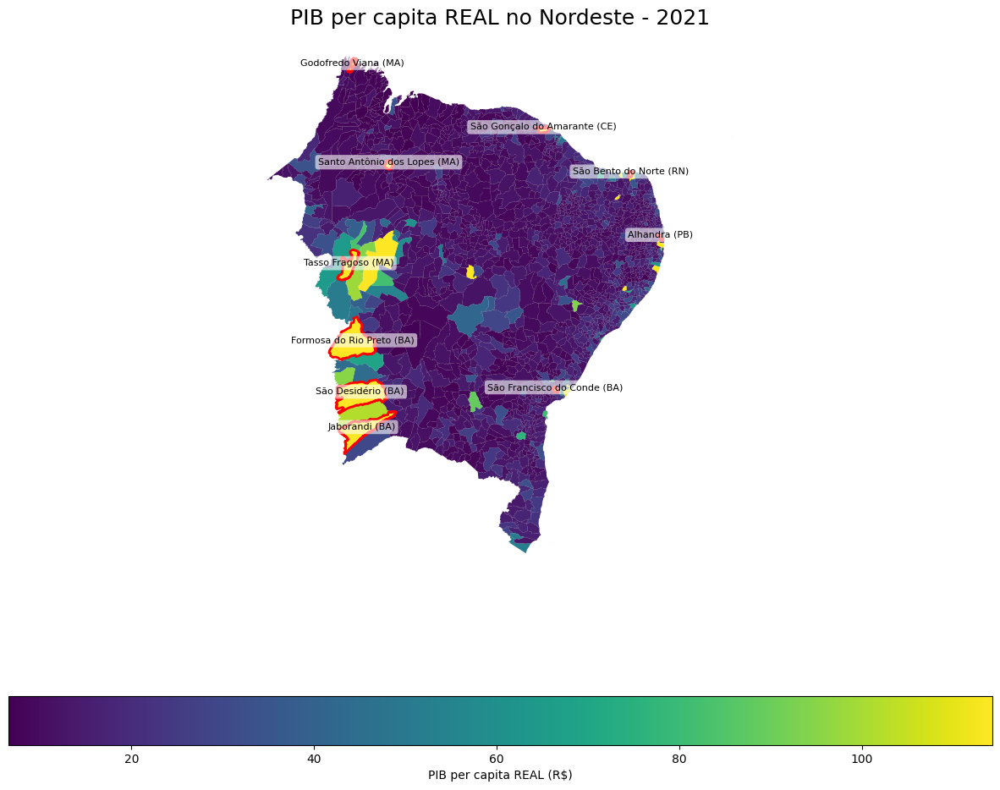

In [ ]:
print("Filtrando dados REAIS de 2021 para o mapa...")
df_mapa_real_2021 = df_ne[df_ne['ano'] == 2021].copy()

df_mapa_real_2021['id_municipio_int'] = df_mapa_real_2021['id_municipio'].astype(int)

top_10_real_ids = df_mapa_real_2021.nlargest(10, 'pib_per_capita')['id_municipio_int'].tolist()
print(f"Top 10 IDs (Reais) identificados.")

print("Baixando os mapas dos municípios (aguarde)...")
geo_municipios_todos = geobr.read_municipality(code_muni='all', year=2020)

print("Baixando o mapa da Região Nordeste...")
geo_regioes_todas = geobr.read_region(year=2020)
geo_regiao_ne = geo_regioes_todas[geo_regioes_todas['code_region'] == 2].copy()

geo_municipios_todos['code_muni_int'] = geo_municipios_todos['code_muni'].astype(int)

mapa_data_completo_real = geo_municipios_todos.merge(
    df_mapa_real_2021,
    left_on='code_muni_int',
    right_on='id_municipio_int'
)

print("Gerando o mapa REAL...")
fig, ax = plt.subplots(figsize=(15, 12))

geo_regiao_ne.plot(
    ax=ax,
    color='#DDDDDD',
    edgecolor='white',
    linewidth=0.5
)

vmin = df_mapa_real_2021['pib_per_capita'].quantile(0.01)
vmax = df_mapa_real_2021['pib_per_capita'].quantile(0.99)

mapa_data_completo_real.plot(
    column='pib_per_capita',
    ax=ax,
    legend=True,
    cmap='viridis',
    vmin=vmin,
    vmax=vmax,
    legend_kwds={'label': "PIB per capita REAL (R$)", 'orientation': "horizontal"}
)

mapa_data_top10_real = mapa_data_completo_real[
    mapa_data_completo_real['id_municipio_int'].isin(top_10_real_ids)
]

mapa_data_top10_real.plot(
    ax=ax,
    facecolor='none',
    edgecolor='red',
    linewidth=2
)

ax.set_title('PIB per capita REAL no Nordeste - 2021', fontsize=18)
ax.axis('off')

for idx, row in mapa_data_top10_real.iterrows():
    centroid = row.geometry.centroid
    ax.annotate(
        text=f"{row['municipio']} ({row['uf']})",
        xy=(centroid.x, centroid.y),
        ha='center',
        fontsize=8,
        color='black',
        bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="none", alpha=0.6)
    )

plt.savefig('mapa_real_nordeste_2021.png', dpi=300)
print("Mapa salvo como 'mapa_real_nordeste_2021.png'")
plt.show()

Filtrando dados REAIS de 2021 para os mapas...
IDs das Capitais do NE identificados: [2704302, 2927408, 2304400, 2111300, 2507507, 2611606, 2211001, 2408102, 2800308]
Baixando os mapas dos municípios (aguarde)...
Baixando o mapa da Região Nordeste...
Gerando os mapas de População e PIB com destaque nas capitais...


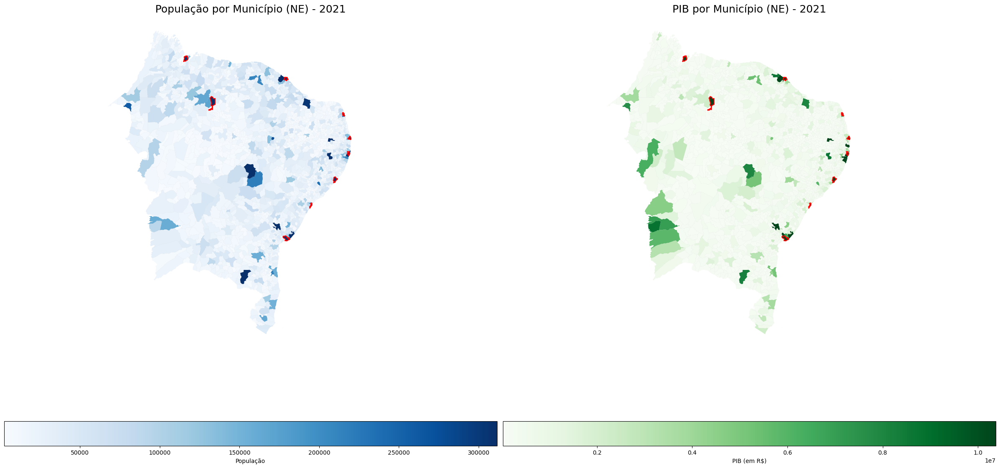

In [ ]:
print("Filtrando dados REAIS de 2021 para os mapas...")
df_mapa_2021 = df_ne[df_ne['ano'] == 2021].copy()

df_mapa_2021['id_municipio_int'] = df_mapa_2021['id_municipio'].astype(int)

capital_ids = df_mapa_2021[
    df_mapa_2021['is_capital'] == 1
]['id_municipio_int'].tolist()
print(f"IDs das Capitais do NE identificados: {capital_ids}")

print("Baixando os mapas dos municípios (aguarde)...")
geo_municipios_todos = geobr.read_municipality(code_muni='all', year=2020)

print("Baixando o mapa da Região Nordeste...")
geo_regioes_todas = geobr.read_region(year=2020)
geo_regiao_ne = geo_regioes_todas[geo_regioes_todas['code_region'] == 2].copy()

geo_municipios_todos['code_muni_int'] = geo_municipios_todos['code_muni'].astype(int)

mapa_data_completo_real = geo_municipios_todos.merge(
    df_mapa_2021,
    left_on='code_muni_int',
    right_on='id_municipio_int'
)

print("Gerando os mapas de População e PIB com destaque nas capitais...")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 12))

ax1.set_title('População por Município (NE) - 2021', fontsize=18)
ax1.axis('off')
geo_regiao_ne.plot(ax=ax1, color='#DDDDDD', edgecolor='white', linewidth=0.5)

pop_vmin = df_mapa_2021['populacao'].quantile(0.01)
pop_vmax = df_mapa_2021['populacao'].quantile(0.99)

mapa_data_completo_real.plot(
    column='populacao',
    ax=ax1,
    legend=True,
    cmap='Blues',
    vmin=pop_vmin,
    vmax=pop_vmax,
    legend_kwds={'label': "População", 'orientation': "horizontal"}
)

mapa_capitais = mapa_data_completo_real[
    mapa_data_completo_real['id_municipio_int'].isin(capital_ids)
]
mapa_capitais.plot(
    ax=ax1,
    facecolor='none',
    edgecolor='red',
    linewidth=1.5
)

ax2.set_title('PIB por Município (NE) - 2021', fontsize=18)
ax2.axis('off')
geo_regiao_ne.plot(ax=ax2, color='#DDDDDD', edgecolor='white', linewidth=0.5)

pib_vmin = df_mapa_2021['pib'].quantile(0.01)
pib_vmax = df_mapa_2021['pib'].quantile(0.99)

mapa_data_completo_real.plot(
    column='pib',
    ax=ax2,
    legend=True,
    cmap='Greens',
    vmin=pib_vmin,
    vmax=pib_vmax,
    legend_kwds={'label': "PIB (em R$)", 'orientation': "horizontal"}
)

mapa_capitais.plot(
    ax=ax2,
    facecolor='none',
    edgecolor='red',
    linewidth=1.5
)

plt.tight_layout()
plt.show()

###CLASSIFICAÇÃO

Criando uma variável nova chamada alta_oportunidade_real que seria, dentro de 1 ano os 25% dos municípios com maior pib_per_capita, para tentar prever se esse alta_oportunidade_real vai ser 1 ou 0.

In [ ]:
resultados_classificacao = []

anos = sorted(df_ranking['ano'].unique())

for ano in anos:
    df_ano = df_ranking[df_ranking['ano'] == ano].copy()

    q75_real = df_ano['pib_per_capita'].quantile(0.75)
    q75_pred = df_ano['pib_pc_previsto'].quantile(0.75)

    df_ano['alta_oportunidade_real'] = (df_ano['pib_per_capita'] >= q75_real).astype(int)
    df_ano['alta_oportunidade_prevista'] = (df_ano['pib_pc_previsto'] >= q75_pred).astype(int)

    acc = accuracy_score(df_ano['alta_oportunidade_real'], df_ano['alta_oportunidade_prevista'])
    cm = confusion_matrix(df_ano['alta_oportunidade_real'], df_ano['alta_oportunidade_prevista'])
    report = classification_report(df_ano['alta_oportunidade_real'], df_ano['alta_oportunidade_prevista'], output_dict=True)

    resultados_classificacao.append({
        'Ano': ano,
        'Acurácia': round(acc, 3),
        'Precisão (classe 1)': round(report['1']['precision'], 3),
        'Recall (classe 1)': round(report['1']['recall'], 3),
        'F1-score (classe 1)': round(report['1']['f1-score'], 3),
        'VP': cm[1,1],
        'FP': cm[0,1],
        'FN': cm[1,0],
        'VN': cm[0,0],
    })

df_resultados = pd.DataFrame(resultados_classificacao)
display(df_resultados)



,Ano,Acurácia,Precisão (classe 1),Recall (classe 1),F1-score (classe 1),VP,FP,FN,VN
0,2018,0.942,0.884,0.884,0.884,397,52,52,1292
1,2019,0.952,0.904,0.904,0.904,406,43,43,1301
2,2020,0.951,0.902,0.902,0.902,405,44,44,1300
3,2021,0.961,0.922,0.922,0.922,414,35,35,1309


Acurácia → porcentagem total de acertos (alta e não alta).

Precisão (classe 1) → dos municípios classificados como alta oportunidade, quantos realmente são.

Recall (classe 1) → dos municípios que realmente são de alta oportunidade, quantos o modelo conseguiu identificar.

F1-score → equilíbrio entre precisão e recall.

VP, FP, FN, VN → valores da matriz de confusão pra entender os tipos de erro.

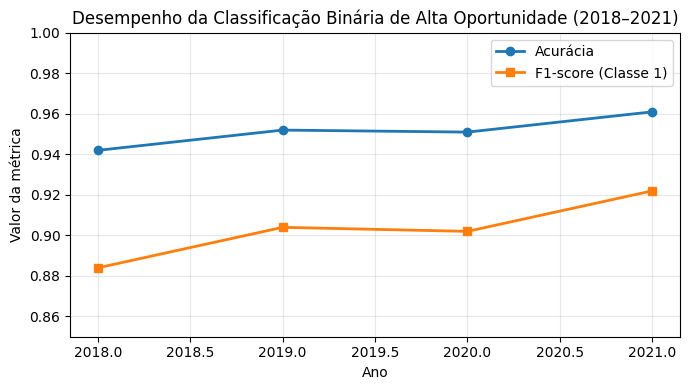

In [ ]:
plt.figure(figsize=(7,4))

plt.plot(df_resultados['Ano'], df_resultados['Acurácia'], marker='o', label='Acurácia', linewidth=2)
plt.plot(df_resultados['Ano'], df_resultados['F1-score (classe 1)'], marker='s', label='F1-score (Classe 1)', linewidth=2)

plt.title('Desempenho da Classificação Binária de Alta Oportunidade (2018–2021)')
plt.xlabel('Ano')
plt.ylabel('Valor da métrica')
plt.ylim(0.85, 1.0)
plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()


O gráfico mostra a evolução das métricas de desempenho da classificação entre 2018 e 2021.
Tanto a acurácia quanto o F1-score se mantêm estáveis e elevados, variando entre 0,88 e 0,96, o que confirma que o modelo teve ótima capacidade de generalização ao longo dos anos.
A leve melhora em 2021 reforça que o comportamento mais recente dos dados socioeconômicos está mais bem captado pelo modelo.

In [ ]:
df_class = df_ranking.copy()

df_class['alta_oportunidade_real'] = 0
df_class['alta_oportunidade_prevista'] = 0

for ano in sorted(df_class['ano'].unique()):
    q75_real = df_class.loc[df_class['ano'] == ano, 'pib_per_capita'].quantile(0.75)
    q75_pred = df_class.loc[df_class['ano'] == ano, 'pib_pc_previsto'].quantile(0.75)

    df_class.loc[df_class['ano'] == ano, 'alta_oportunidade_real'] = (
        df_class.loc[df_class['ano'] == ano, 'pib_per_capita'] >= q75_real
    ).astype(int)

    df_class.loc[df_class['ano'] == ano, 'alta_oportunidade_prevista'] = (
        df_class.loc[df_class['ano'] == ano, 'pib_pc_previsto'] >= q75_pred
    ).astype(int)

In [ ]:
constancia_real = (
    df_class.groupby(['municipio', 'uf'])['alta_oportunidade_real']
    .mean().reset_index()
    .rename(columns={'alta_oportunidade_real': 'constancia_real'})
)

constancia_prevista = (
    df_class.groupby(['municipio', 'uf'])['alta_oportunidade_prevista']
    .mean().reset_index()
    .rename(columns={'alta_oportunidade_prevista': 'constancia_prevista'})
)

constancia = constancia_real.merge(constancia_prevista, on=['municipio', 'uf'], how='outer')

constancia['anos_alta_real'] = (constancia['constancia_real'] * 4).round().astype(int)
constancia['anos_alta_prevista'] = (constancia['constancia_prevista'] * 4).round().astype(int)

constancia_top = constancia.sort_values('constancia_prevista', ascending=False)

In [ ]:
taxa_estabilidade_real = constancia['constancia_real'].mean()
taxa_estabilidade_prevista = constancia['constancia_prevista'].mean()

def classificar_estabilidade(x):
    if x == 0:
        return 'Nunca alta oportunidade'
    elif x == 1:
        return 'Sempre alta oportunidade'
    else:
        return 'Instável'

constancia['categoria_real'] = constancia['constancia_real'].apply(classificar_estabilidade)
constancia['categoria_prevista'] = constancia['constancia_prevista'].apply(classificar_estabilidade)

dist_real = constancia['categoria_real'].value_counts(normalize=True).mul(100).round(1)
dist_prevista = constancia['categoria_prevista'].value_counts(normalize=True).mul(100).round(1)

print("=== Taxas gerais de estabilidade ===")
print(f"Estabilidade média real: {taxa_estabilidade_real:.3f}")
print(f"Estabilidade média prevista: {taxa_estabilidade_prevista:.3f}\n")

print("=== Distribuição (em %) ===")
print("Real:")
print(dist_real)
print("\nPrevista:")
print(dist_prevista)

=== Taxas gerais de estabilidade ===
Estabilidade média real: 0.250
Estabilidade média prevista: 0.250

=== Distribuição (em %) ===
Real:
categoria_real
Nunca alta oportunidade     69.6
Sempre alta oportunidade    20.0
Instável                    10.4
Name: proportion, dtype: float64

Prevista:
categoria_prevista
Nunca alta oportunidade     68.4
Sempre alta oportunidade    19.3
Instável                    12.3
Name: proportion, dtype: float64


A análise de estabilidade mostrou que tanto os dados observados quanto as previsões do modelo XGBoost apresentaram padrões muito semelhantes de comportamento. A estabilidade média foi de 0,25, indicando que, em média, os municípios permaneceram como de alta oportunidade em um quarto do período analisado (2018–2021).

Em termos de distribuição, cerca de 20% dos municípios se mantiveram como de alta oportunidade durante todos os quatro anos, tanto na base real quanto na prevista. A maioria (em torno de 68%–70%) nunca atingiu esse grupo, enquanto 10% a 12% apresentaram comportamento instável, alternando entre anos de alta e baixa oportunidade.

Esses resultados mostram que o modelo consegue refletir bem a estrutura regional: a maior parte dos municípios nordestinos permanece em níveis mais baixos de potencial de investimento, enquanto um grupo menor se destaca de forma consistente. Além disso, o percentual de municípios instáveis reforça que há certa mobilidade econômica no período, com alguns locais alternando entre crescimento e retração conforme as condições setoriais e fiscais.

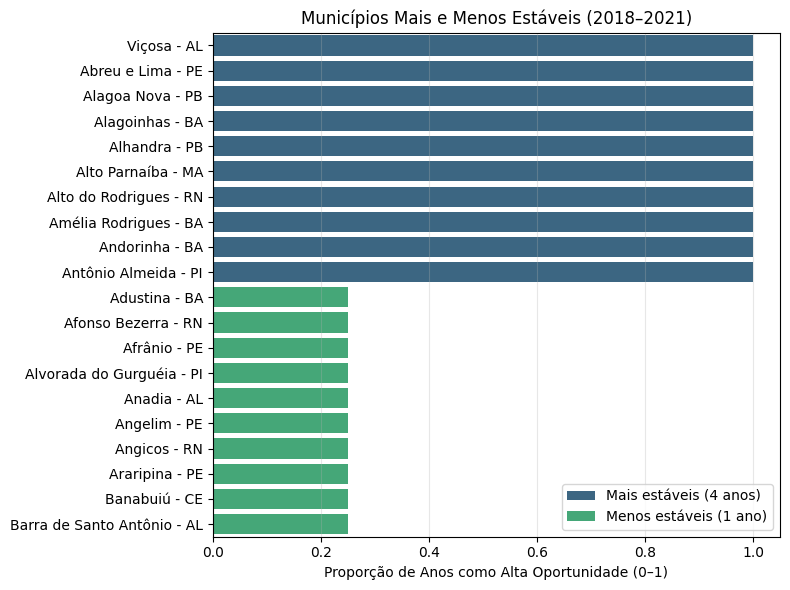

In [ ]:
top_estaveis = constancia[constancia['anos_alta_prevista'] == 4].sort_values(
    'constancia_prevista', ascending=False).head(10)

menos_estaveis = constancia[constancia['anos_alta_prevista'] == 1].sort_values(
    'constancia_prevista', ascending=False).head(10)

top_estaveis['Grupo'] = 'Mais estáveis (4 anos)'
menos_estaveis['Grupo'] = 'Menos estáveis (1 ano)'

plot_constancia = pd.concat([top_estaveis, menos_estaveis])

plot_constancia['label'] = plot_constancia['municipio'] + ' - ' + plot_constancia['uf']

plt.figure(figsize=(8,6))
sns.barplot(data=plot_constancia, y='label', x='constancia_prevista', hue='Grupo', dodge=False, palette='viridis')

plt.title('Municípios Mais e Menos Estáveis (2018–2021)')
plt.xlabel('Proporção de Anos como Alta Oportunidade (0–1)')
plt.ylabel('')
plt.xlim(0, 1.05)
plt.legend(title='')
plt.grid(axis='x', alpha=0.3)
plt.tight_layout()
plt.show()


O gráfico acima mostra os municípios mais e menos estáveis em relação à presença no grupo de alta oportunidade entre 2018 e 2021. No topo aparecem localidades como Viçosa (AL), Abreu e Lima (PE), Alagoa Nova (PB), Alagoinhas (BA) e Alto Parnaíba (MA), que mantiveram alto desempenho em todos os anos do período analisado. Esses municípios apresentam características estruturais sólidas, como boa base industrial, emprego formal e arrecadação consistente, o que explica sua permanência entre os de maior potencial.

Na outra ponta estão os municípios que entraram no grupo de alta oportunidade em apenas um dos quatro anos, como Adustina (BA), Afonso Bezerra (RN) e Araripina (PE). Esses casos indicam comportamentos mais voláteis, provavelmente relacionados a fatores conjunturais, como variações na produção agrícola, investimentos temporários ou mudanças fiscais.

Essa comparação reforça que o modelo conseguiu captar bem os padrões de estabilidade econômica no Nordeste, diferenciando os polos consolidados dos municípios que apresentam apenas movimentos pontuais de crescimento.

Preparando dados para o mapa...
Baixando os mapas dos municípios (aguarde)...
Baixando o mapa da Região Nordeste...
Gerando os mapas...


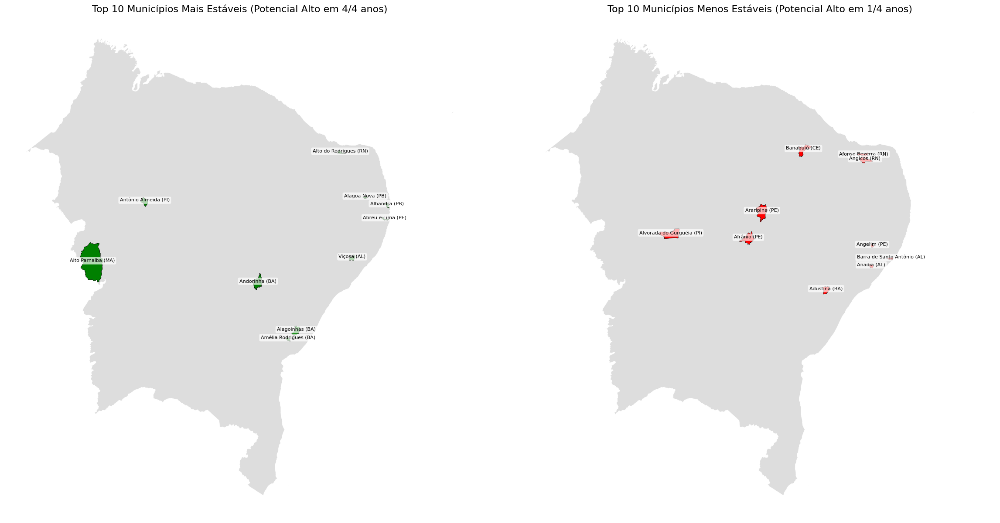

In [ ]:
print("Preparando dados para o mapa...")

municipio_lookup = df_ne[['id_municipio', 'municipio', 'uf']].drop_duplicates()

try:
    top_estaveis_com_id = pd.merge(
        top_estaveis,
        municipio_lookup,
        on=['municipio', 'uf'],
        how='left'
    )

    menos_estaveis_com_id = pd.merge(
        menos_estaveis,
        municipio_lookup,
        on=['municipio', 'uf'],
        how='left'
    )
except NameError:
    print("Erro: Os DataFrames 'top_estaveis', 'menos_estaveis' ou 'df_ne' não foram encontrados.")
    print("Por favor, rode o código que cria esses DataFrames primeiro.")
    raise
except KeyError:
    print("Erro de Chave: Verifique se 'municipio' e 'uf' são colunas (e não o índice) nos DFs.")
    print("Se forem o índice, use .reset_index() neles primeiro.")
    raise

top_estaveis_com_id['id_municipio_int'] = top_estaveis_com_id['id_municipio'].astype(int)
menos_estaveis_com_id['id_municipio_int'] = menos_estaveis_com_id['id_municipio'].astype(int)

print("Baixando os mapas dos municípios (aguarde)...")
geo_municipios_todos = geobr.read_municipality(code_muni='all', year=2020)

print("Baixando o mapa da Região Nordeste...")
geo_regioes_todas = geobr.read_region(year=2020)
geo_regiao_ne = geo_regioes_todas[geo_regioes_todas['code_region'] == 2].copy()

geo_municipios_todos['code_muni_int'] = geo_municipios_todos['code_muni'].astype(int)

mapa_data_estaveis = geo_municipios_todos.merge(
    top_estaveis_com_id,
    left_on='code_muni_int',
    right_on='id_municipio_int'
)

mapa_data_menos_estaveis = geo_municipios_todos.merge(
    menos_estaveis_com_id,
    left_on='code_muni_int',
    right_on='id_municipio_int'
)

print("Gerando os mapas...")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 12))

ax1.set_title('Top 10 Municípios Mais Estáveis (Potencial Alto em 4/4 anos)', fontsize=16)
ax1.axis('off')
geo_regiao_ne.plot(ax=ax1, color='#DDDDDD', edgecolor='white', linewidth=0.5)

mapa_data_estaveis.plot(
    ax=ax1,
    color='green',
    edgecolor='black',
    linewidth=0.5,
    label='Mais Estáveis'
)

for idx, row in mapa_data_estaveis.iterrows():
    centroid = row.geometry.centroid
    ax1.annotate(
        text=f"{row['municipio']} ({row['uf']})",
        xy=(centroid.x, centroid.y),
        ha='center',
        fontsize=8,
        color='black',
        bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="none", alpha=0.7)
    )

ax2.set_title('Top 10 Municípios Menos Estáveis (Potencial Alto em 1/4 anos)', fontsize=16)
ax2.axis('off')
geo_regiao_ne.plot(ax=ax2, color='#DDDDDD', edgecolor='white', linewidth=0.5)

mapa_data_menos_estaveis.plot(
    ax=ax2,
    color='red',
    edgecolor='black',
    linewidth=0.5,
    label='Menos Estáveis'
)

for idx, row in mapa_data_menos_estaveis.iterrows():
    centroid = row.geometry.centroid
    ax2.annotate(
        text=f"{row['municipio']} ({row['uf']})",
        xy=(centroid.x, centroid.y),
        ha='center',
        fontsize=8,
        color='black',
        bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="none", alpha=0.7)
    )

plt.tight_layout()
plt.show()

In [ ]:

X = df_class[features_sem_adespss]
y = df_class['alta_oportunidade_real']

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

resultados = []

log_reg = LogisticRegression(max_iter=1000, random_state=42)
log_reg.fit(X_train, y_train)
y_pred_log = log_reg.predict(X_test)

resultados.append({
    'Modelo': 'Logistic Regression',
    'Acurácia': accuracy_score(y_test, y_pred_log),
    'Precisão': precision_score(y_test, y_pred_log),
    'Recall': recall_score(y_test, y_pred_log),

    'F1-score': f1_score(y_test, y_pred_log)
})

rf_clf = RandomForestClassifier(n_estimators=500, random_state=42)
rf_clf.fit(X_train, y_train)
y_pred_rf = rf_clf.predict(X_test)

resultados.append({
    'Modelo': 'Random Forest',
    'Acurácia': accuracy_score(y_test, y_pred_rf),
    'Precisão': precision_score(y_test, y_pred_rf),
    'Recall': recall_score(y_test, y_pred_rf),
    'F1-score': f1_score(y_test, y_pred_rf)
})

xgb_clf = XGBClassifier(
    n_estimators=800,
    learning_rate=0.03,
    max_depth=6,
    subsample=0.9,
    colsample_bytree=0.9,
    reg_lambda=1.0,
    reg_alpha=0.0,
    random_state=42,
    objective='binary:logistic',
    tree_method='hist'
)
xgb_clf.fit(X_train, y_train)
y_pred_xgb = xgb_clf.predict(X_test)

resultados.append({
    'Modelo': 'XGBoost',
    'Acurácia': accuracy_score(y_test, y_pred_xgb),
    'Precisão': precision_score(y_test, y_pred_xgb),
    'Recall': recall_score(y_test, y_pred_xgb),
    'F1-score': f1_score(y_test, y_pred_xgb)
})

df_comparacao = pd.DataFrame(resultados)
df_comparacao = df_comparacao.sort_values('F1-score', ascending=False).reset_index(drop=True)
display(df_comparacao)



,Modelo,Acurácia,Precisão,Recall,F1-score
0,XGBoost,0.918467,0.876056,0.809896,0.841678
1,Random Forest,0.910801,0.857542,0.799479,0.827493
2,Logistic Regression,0.892683,0.873377,0.700521,0.777457


A comparação entre os três modelos de classificação — Regressão Logística, Random Forest e XGBoost — mostrou que todos apresentaram bom desempenho, mas com diferenças consistentes em termos de precisão e estabilidade. O XGBoost foi o que obteve os melhores resultados gerais, com acurácia de 0,918 e F1-score de 0,842, superando os demais tanto em precisão quanto em equilíbrio entre acertos e erros.

O Random Forest também apresentou um desempenho sólido, com acurácia de 0,911 e F1-score de 0,827, confirmando que os métodos baseados em árvores são eficazes para esse tipo de dado. Já a Regressão Logística, embora mais simples, teve resultados um pouco inferiores (F1-score de 0,777), o que era esperado, já que se trata de um modelo linear e o comportamento das variáveis socioeconômicas é claramente não linear.

De forma geral, os resultados indicam que o XGBoost é o modelo mais adequado para identificar municípios com alto potencial de investimento, equilibrando bem precisão e recall e apresentando melhor capacidade de generalização. Essa comparação também valida o uso do XGBoost como modelo final, confirmando que o ganho de complexidade traz melhorias reais na qualidade das previsões.

In [ ]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22268 entries, 0 to 22267
Data columns (total 27 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id_municipio             22268 non-null  object 
 1   municipio                22268 non-null  object 
 2   ano                      22268 non-null  int64  
 3   uf                       22268 non-null  object 
 4   populacao                22268 non-null  int64  
 5   area                     22268 non-null  float64
 6   classificacao_capag      22268 non-null  int64  
 7   pib                      22268 non-null  int64  
 8   impostos_liquidos        22268 non-null  int64  
 9   va                       22268 non-null  int64  
 10  va_agropecuaria          22268 non-null  int64  
 11  va_industria             22268 non-null  int64  
 12  va_servicos              22268 non-null  int64  
 13  va_adespss               22268 non-null  int64  
 14  total_vinculos        